<a href="https://colab.research.google.com/github/Jar-17/AI_for_herb_analysis/blob/main/segmentation_5_kinds.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Connect to Google Drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Import

In [ ]:
import os
import json
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
from glob import glob

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras import backend as K

import matplotlib.pyplot as plt

In [ ]:
print(tf. __version__)

2.15.0


## 參數設定

In [ ]:
# 藥物名稱
# LABELS = ['牡丹皮','川芎','薄荷','白术','防風']
LABELS = ['甘草','當歸','薄荷','白术','牡丹皮']

# 對應顏色
COLORS = ['blue', 'green', 'red' ,'black' , 'purple']

# 訓練和驗證集比例
VAL_SPLIT = 0.15


# 每份資料取點數目
NUM_SAMPLE_POINTS = 2048 #5個點嘗試2048

# NUM_SAMPLE_POINTS = len(point_clouds[0])

BATCH_SIZE = 32
EPOCHS = 200
INITIAL_LR = 5e-5
# 所有參數都可自行調整

## Generate custom "point_clouds3.npy", "point_clouds_labels3.npy", "all_labels3.npy"(第一次才需執行，之後可直接執行load_data)


In [ ]:
import pandas as pd
import numpy as np
import os

directory = '/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/'
groups = ['甘草','當歸','薄荷','白术','牡丹皮']
num_files = 200

point_clouds = []
point_cloud_labels = []
all_labels = []

for file_index in range(1, num_files+1):
    temp_point_clouds_array = []
    temp_point_clouds_labels_array = []
    temp_all_labels_array = []

    for group in groups:
        file_path = os.path.join(directory, f'{group}/{group}_noi-{file_index}.csv')
        print(file_path)
        if os.path.exists(file_path):
            df = pd.read_csv(file_path)
            df = df.rename(columns={"Wavelength": "Time"})
            if(group == '白术' or  group =='薄荷' or group == '當歸'):
            # wavelength明顯沿著時間取每10點
              df = df.iloc[:,::5]
            elif (group == '牡丹皮'):
              df = df.iloc[:,::10]
            else:
            # 沿著wavelength取每10點
              df = df.iloc[::5,:]
            # print(df)
            df = df.melt(id_vars=["Time"], var_name="Wavelength", value_name="Height")

            df["Height"] = pd.to_numeric(df["Height"], errors='coerce')
            df = df.dropna(subset=["Height"])
# 將小於0.15的，沒有代表性的資料捨去
            df_filtered = df[df["Height"] >= 0.1]
            # print(df_filtered)

            # print(df_filtered)
            # print(df_filtered)
# random sample

# Perform random sampling on the "Wavelength" column
            #random_times紀錄random_sample選取的indices
            filtered_array = df_filtered.to_numpy()
            # print(len(filtered_array))
            # if(len(filtered_array)>NUM_SAMPLE_POINTS):
            #   idx = np.random.choice(np.arange(filtered_array.shape[0]),int(len(filtered_array)/3))
            #   result_array = filtered_array[idx]
            #   print(len(result_array))
            # else:
            result_array = filtered_array
              # print(len(result_array))

            cloud_label_element = np.zeros(len(groups)+1)
            cloud_label_element[groups.index(group)] = 1

            temp_point_clouds_array.append(result_array)
            temp_point_clouds_labels_array.extend([cloud_label_element] * result_array.shape[0])
            temp_all_labels_array.extend([group] * result_array.shape[0])

    temp_point_clouds_array = np.vstack(temp_point_clouds_array)
    temp_point_clouds_labels_array = np.array(temp_point_clouds_labels_array)
    temp_all_labels_array = np.array(temp_all_labels_array)
    point_clouds.append(temp_point_clouds_array.astype(float))
    point_cloud_labels.append(temp_point_clouds_labels_array.astype(float))
    all_labels.append(temp_all_labels_array.astype("U10"))
    print(f"finish {file_index}")

print("Files saved successfully.")

/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-1.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-1.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-1.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-1.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-1.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 1
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-2.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-2.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-2.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-2.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-2.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 2
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-3.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-3.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-3.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-3.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-3.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 3
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-4.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-4.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-4.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-4.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-4.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 4
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-5.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-5.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-5.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-5.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-5.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 5
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-6.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-6.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-6.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-6.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-6.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 6
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-7.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-7.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-7.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-7.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-7.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 7
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-8.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-8.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-8.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-8.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-8.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 8
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-9.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-9.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-9.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-9.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-9.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 9
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-10.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-10.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-10.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-10.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-10.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 10
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-11.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-11.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-11.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-11.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-11.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 11
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-12.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-12.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-12.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-12.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-12.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 12
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-13.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-13.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-13.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-13.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-13.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 13
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-14.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-14.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-14.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-14.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-14.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 14
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-15.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-15.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-15.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-15.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-15.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 15
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-16.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-16.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-16.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-16.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-16.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 16
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-17.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-17.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-17.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-17.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-17.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 17
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-18.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-18.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-18.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-18.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-18.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 18
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-19.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-19.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-19.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-19.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-19.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 19
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-20.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-20.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-20.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-20.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-20.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 20
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-21.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-21.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-21.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-21.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-21.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 21
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-22.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-22.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-22.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-22.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-22.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 22
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-23.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-23.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-23.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-23.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-23.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 23
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-24.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-24.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-24.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-24.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-24.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 24
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-25.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-25.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-25.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-25.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-25.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 25
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-26.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-26.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-26.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-26.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-26.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 26
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-27.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-27.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-27.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-27.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-27.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 27
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-28.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-28.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-28.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-28.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-28.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 28
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-29.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-29.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-29.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-29.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-29.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 29
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-30.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-30.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-30.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-30.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-30.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 30
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-31.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-31.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-31.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-31.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-31.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 31
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-32.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-32.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-32.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-32.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-32.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 32
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-33.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-33.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-33.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-33.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-33.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 33
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-34.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-34.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-34.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-34.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-34.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 34
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-35.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-35.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-35.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-35.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-35.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 35
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-36.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-36.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-36.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-36.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-36.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 36
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-37.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-37.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-37.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-37.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-37.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 37
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-38.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-38.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-38.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-38.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-38.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 38
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-39.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-39.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-39.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-39.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-39.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 39
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-40.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-40.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-40.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-40.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-40.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 40
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-41.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-41.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-41.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-41.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-41.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 41
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-42.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-42.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-42.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-42.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-42.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 42
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-43.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-43.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-43.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-43.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-43.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 43
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-44.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-44.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-44.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-44.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-44.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 44
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-45.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-45.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-45.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-45.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-45.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 45
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-46.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-46.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-46.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-46.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-46.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 46
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-47.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-47.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-47.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-47.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-47.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 47
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-48.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-48.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-48.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-48.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-48.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 48
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-49.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-49.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-49.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-49.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-49.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 49
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-50.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-50.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-50.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-50.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-50.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 50
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-51.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-51.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-51.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-51.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-51.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 51
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-52.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-52.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-52.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-52.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-52.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 52
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-53.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-53.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-53.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-53.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-53.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 53
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-54.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-54.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-54.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-54.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-54.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 54
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-55.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-55.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-55.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-55.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-55.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 55
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-56.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-56.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-56.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-56.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-56.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 56
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-57.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-57.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-57.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-57.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-57.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 57
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-58.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-58.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-58.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-58.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-58.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 58
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-59.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-59.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-59.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-59.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-59.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 59
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-60.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-60.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-60.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-60.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-60.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 60
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-61.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-61.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-61.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-61.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-61.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 61
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-62.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-62.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-62.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-62.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-62.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 62
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-63.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-63.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-63.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-63.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-63.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 63
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-64.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-64.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-64.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-64.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-64.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 64
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-65.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-65.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-65.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-65.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-65.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 65
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-66.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-66.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-66.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-66.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-66.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 66
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-67.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-67.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-67.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-67.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-67.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 67
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-68.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-68.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-68.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-68.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-68.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 68
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-69.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-69.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-69.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-69.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-69.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 69
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-70.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-70.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-70.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-70.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-70.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 70
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-71.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-71.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-71.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-71.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-71.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 71
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-72.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-72.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-72.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-72.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-72.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 72
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-73.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-73.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-73.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-73.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-73.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 73
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-74.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-74.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-74.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-74.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-74.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 74
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-75.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-75.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-75.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-75.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-75.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 75
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-76.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-76.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-76.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-76.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-76.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 76
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-77.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-77.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-77.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-77.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-77.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 77
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-78.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-78.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-78.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-78.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-78.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 78
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-79.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-79.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-79.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-79.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-79.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 79
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-80.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-80.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-80.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-80.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-80.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 80
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-81.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-81.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-81.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-81.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-81.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 81
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-82.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-82.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-82.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-82.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-82.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 82
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-83.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-83.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-83.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-83.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-83.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 83
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-84.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-84.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-84.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-84.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-84.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 84
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-85.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-85.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-85.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-85.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-85.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 85
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-86.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-86.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-86.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-86.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-86.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 86
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-87.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-87.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-87.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-87.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-87.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 87
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-88.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-88.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-88.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-88.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-88.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 88
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-89.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-89.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-89.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-89.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-89.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 89
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-90.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-90.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-90.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-90.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-90.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 90
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-91.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-91.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-91.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-91.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-91.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 91
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-92.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-92.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-92.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-92.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-92.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 92
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-93.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-93.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-93.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-93.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-93.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 93
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-94.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-94.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-94.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-94.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-94.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 94
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-95.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-95.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-95.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-95.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-95.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 95
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-96.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-96.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-96.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-96.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-96.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 96
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-97.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-97.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-97.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-97.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-97.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 97
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-98.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-98.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-98.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-98.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-98.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 98
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-99.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-99.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-99.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-99.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-99.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 99
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-100.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-100.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-100.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-100.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-100.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 100
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-101.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-101.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-101.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-101.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-101.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 101
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-102.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-102.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-102.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-102.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-102.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 102
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-103.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-103.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-103.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-103.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-103.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 103
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-104.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-104.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-104.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-104.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-104.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 104
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-105.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-105.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-105.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-105.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-105.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 105
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-106.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-106.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-106.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-106.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-106.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 106
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-107.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-107.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-107.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-107.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-107.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 107
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-108.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-108.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-108.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-108.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-108.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 108
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-109.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-109.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-109.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-109.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-109.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 109
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-110.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-110.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-110.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-110.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-110.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 110
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-111.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-111.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-111.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-111.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-111.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 111
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-112.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-112.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-112.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-112.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-112.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 112
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-113.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-113.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-113.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-113.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-113.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 113
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-114.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-114.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-114.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-114.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-114.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 114
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-115.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-115.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-115.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-115.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-115.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 115
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-116.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-116.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-116.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-116.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-116.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 116
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-117.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-117.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-117.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-117.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-117.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 117
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-118.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-118.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-118.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-118.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-118.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 118
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-119.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-119.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-119.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-119.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-119.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 119
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-120.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-120.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-120.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-120.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-120.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 120
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-121.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-121.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-121.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-121.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-121.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 121
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-122.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-122.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-122.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-122.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-122.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 122
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-123.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-123.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-123.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-123.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-123.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 123
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-124.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-124.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-124.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-124.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-124.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 124
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-125.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-125.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-125.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-125.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-125.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 125
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-126.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-126.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-126.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-126.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-126.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 126
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-127.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-127.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-127.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-127.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-127.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 127
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-128.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-128.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-128.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-128.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-128.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 128
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-129.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-129.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-129.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-129.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-129.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 129
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-130.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-130.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-130.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-130.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-130.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 130
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-131.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-131.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-131.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-131.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-131.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 131
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-132.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-132.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-132.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-132.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-132.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 132
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-133.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-133.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-133.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-133.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-133.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 133
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-134.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-134.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-134.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-134.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-134.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 134
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-135.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-135.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-135.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-135.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-135.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 135
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-136.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-136.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-136.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-136.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-136.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 136
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-137.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-137.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-137.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-137.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-137.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 137
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-138.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-138.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-138.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-138.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-138.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 138
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-139.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-139.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-139.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-139.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-139.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 139
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-140.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-140.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-140.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-140.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-140.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 140
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-141.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-141.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-141.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-141.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-141.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 141
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-142.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-142.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-142.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-142.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-142.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 142
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-143.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-143.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-143.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-143.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-143.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 143
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-144.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-144.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-144.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-144.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-144.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 144
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-145.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-145.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-145.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-145.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-145.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 145
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-146.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-146.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-146.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-146.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-146.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 146
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-147.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-147.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-147.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-147.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-147.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 147
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-148.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-148.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-148.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-148.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-148.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 148
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-149.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-149.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-149.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-149.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-149.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 149
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-150.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-150.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-150.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-150.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-150.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 150
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-151.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-151.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-151.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-151.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-151.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 151
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-152.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-152.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-152.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-152.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-152.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 152
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-153.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-153.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-153.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-153.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-153.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 153
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-154.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-154.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-154.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-154.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-154.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 154
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-155.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-155.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-155.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-155.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-155.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 155
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-156.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-156.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-156.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-156.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-156.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 156
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-157.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-157.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-157.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-157.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-157.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 157
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-158.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-158.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-158.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-158.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-158.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 158
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-159.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-159.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-159.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-159.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-159.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 159
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-160.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-160.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-160.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-160.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-160.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 160
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-161.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-161.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-161.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-161.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-161.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 161
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-162.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-162.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-162.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-162.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-162.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 162
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-163.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-163.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-163.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-163.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-163.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 163
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-164.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-164.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-164.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-164.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-164.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 164
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-165.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-165.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-165.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-165.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-165.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 165
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-166.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-166.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-166.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-166.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-166.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 166
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-167.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-167.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-167.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-167.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-167.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 167
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-168.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-168.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-168.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-168.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-168.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 168
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-169.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-169.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-169.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-169.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-169.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 169
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-170.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-170.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-170.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-170.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-170.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 170
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-171.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-171.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-171.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-171.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-171.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 171
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-172.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-172.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-172.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-172.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-172.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 172
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-173.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-173.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-173.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-173.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-173.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 173
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-174.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-174.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-174.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-174.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-174.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 174
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-175.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-175.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-175.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-175.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-175.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 175
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-176.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-176.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-176.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-176.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-176.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 176
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-177.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-177.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-177.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-177.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-177.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 177
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-178.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-178.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-178.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-178.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-178.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 178
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-179.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-179.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-179.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-179.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-179.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 179
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-180.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-180.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-180.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-180.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-180.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 180
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-181.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-181.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-181.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-181.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-181.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 181
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-182.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-182.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-182.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-182.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-182.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 182
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-183.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-183.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-183.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-183.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-183.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 183
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-184.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-184.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-184.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-184.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-184.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 184
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-185.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-185.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-185.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-185.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-185.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 185
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-186.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-186.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-186.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-186.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-186.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 186
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-187.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-187.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-187.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-187.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-187.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 187
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-188.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-188.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-188.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-188.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-188.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 188
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-189.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-189.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-189.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-189.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-189.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 189
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-190.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-190.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-190.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-190.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-190.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 190
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-191.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-191.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-191.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-191.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-191.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 191
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-192.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-192.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-192.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-192.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-192.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 192
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-193.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-193.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-193.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-193.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-193.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 193
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-194.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-194.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-194.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-194.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-194.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 194
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-195.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-195.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-195.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-195.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-195.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 195
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-196.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-196.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-196.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-196.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-196.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 196
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-197.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-197.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-197.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-197.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-197.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 197
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-198.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-198.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-198.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-198.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-198.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 198
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-199.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-199.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-199.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-199.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-199.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


finish 199
/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/甘草/甘草_noi-200.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/當歸/當歸_noi-200.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/薄荷/薄荷_noi-200.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/白术/白术_noi-200.csv


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/牡丹皮/牡丹皮_noi-200.csv
finish 200
Files saved successfully.


<ipython-input-83-dec97d1802dd>:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


In [ ]:
for k in range (200):
# for k in range (1):
   point_clouds[k] = np.array(point_clouds[k])
   point_cloud_labels[k] = np.array(point_cloud_labels[k])
   all_labels[k] = np.array(all_labels[k])

print(point_clouds)
print(point_cloud_labels)
print(all_labels)

[array([[2.66666700e+00, 1.89458000e+02, 3.72486067e-01],
       [2.75000000e+00, 1.89458000e+02, 1.71482065e+00],
       [2.83333300e+00, 1.89458000e+02, 1.69079173e+00],
       ...,
       [2.38000000e+01, 3.41307000e+02, 1.15095733e-01],
       [2.37666700e+01, 3.44902000e+02, 1.06091287e-01],
       [2.37833300e+01, 3.44902000e+02, 1.03811851e-01]]), array([[2.66666700e+00, 1.89458000e+02, 3.83327486e-01],
       [2.75000000e+00, 1.89458000e+02, 1.75845749e+00],
       [2.83333300e+00, 1.89458000e+02, 1.73020334e+00],
       ...,
       [2.37666700e+01, 3.44902000e+02, 1.13300624e-01],
       [2.37833300e+01, 3.44902000e+02, 1.08771511e-01],
       [2.38000000e+01, 3.44902000e+02, 1.03124275e-01]]), array([[2.66666700e+00, 1.89458000e+02, 3.61652249e-01],
       [2.75000000e+00, 1.89458000e+02, 1.68714419e+00],
       [2.83333300e+00, 1.89458000e+02, 1.66104900e+00],
       ...,
       [2.37500000e+01, 3.44902000e+02, 1.00369933e-01],
       [2.37666700e+01, 3.44902000e+02, 1.07382

## Load data

In [ ]:
point_clouds = np.load('/content/drive/MyDrive/5種藥材/point_clouds_thres_0.1_5kind_points2048.npy',allow_pickle=True)
point_cloud_labels = np.load('/content/drive/MyDrive/5種藥材/point_cloud_labels_thres_0.1_5kind_points2048.npy',allow_pickle= True)
all_labels = np.load('/content/drive/MyDrive/5種藥材/all_labels_thres_0.1_5kind_points2048.npy', allow_pickle = True)

print(f"{'Variable':<20} {'Data Type':<10} {'Shape'}")
print(f"point_clouds      {point_clouds.dtype.name:<10} {point_clouds.shape}")
print(f"point_cloud_labels {point_cloud_labels.dtype.name:<10} {point_cloud_labels.shape}")
print(f"all_labels        {all_labels.dtype.name:<10} {all_labels.shape}")

Variable             Data Type  Shape
point_clouds      float64    (200, 2048, 3)
point_cloud_labels float64    (200, 2048, 6)
all_labels        str96      (200, 2048)


## 資料正規化

In [ ]:
for index in tqdm(range(len(point_clouds))):
    current_point_cloud = point_clouds[index]
    current_label_cloud = point_cloud_labels[index]
    current_labels = all_labels[index]
    num_points = len(current_point_cloud)
    # Randomly sampling respective indices.
    print(range(num_points))
    sampled_indices = random.sample(list(range(num_points)), NUM_SAMPLE_POINTS)
    # Sampling points corresponding to sampled indices.
    sampled_point_cloud = np.array([current_point_cloud[i] for i in sampled_indices])
    # Sampling corresponding one-hot encoded labels.
    sampled_label_cloud = np.array([current_label_cloud[i] for i in sampled_indices])
    # Sampling corresponding labels for visualization.
    sampled_labels = np.array([current_labels[i] for i in sampled_indices])
    # Normalizing sampled point cloud.
    norm_point_cloud = sampled_point_cloud - np.mean(sampled_point_cloud, axis=0)

    norm_point_cloud /= np.max(np.linalg.norm(norm_point_cloud, axis=1))
    # point_clouds[index] = np.resize(point_clouds[index],(2048,3))
    point_clouds[index] = norm_point_cloud
    point_cloud_labels[index] = sampled_label_cloud
    all_labels[index] = sampled_labels

  5%|▌         | 10/200 [00:00<00:02, 93.56it/s]

range(0, 6218)
range(0, 6189)
range(0, 5827)
range(0, 5461)
range(0, 6158)
range(0, 4965)
range(0, 5322)
range(0, 5243)
range(0, 6260)
range(0, 5759)
range(0, 5686)
range(0, 5381)
range(0, 5119)
range(0, 6376)
range(0, 6312)
range(0, 5926)
range(0, 5603)
range(0, 5752)
range(0, 5981)
range(0, 5661)
range(0, 6237)


 16%|█▋        | 33/200 [00:00<00:01, 107.92it/s]

range(0, 5356)
range(0, 5400)
range(0, 5381)
range(0, 6601)
range(0, 6763)
range(0, 6473)
range(0, 6473)
range(0, 6446)
range(0, 6327)
range(0, 5554)
range(0, 6357)
range(0, 5894)
range(0, 5483)
range(0, 5896)
range(0, 6006)
range(0, 6055)
range(0, 5497)
range(0, 5984)
range(0, 5251)
range(0, 5715)
range(0, 5743)
range(0, 5687)
range(0, 5895)
range(0, 5574)
range(0, 5596)


 29%|██▉       | 58/200 [00:00<00:01, 109.75it/s]

range(0, 6324)
range(0, 5745)
range(0, 5835)
range(0, 6231)
range(0, 5129)
range(0, 6358)
range(0, 6413)
range(0, 5706)
range(0, 6009)
range(0, 5542)
range(0, 5840)
range(0, 5945)
range(0, 6272)
range(0, 5259)
range(0, 6230)
range(0, 5186)
range(0, 5782)
range(0, 5761)
range(0, 5865)
range(0, 6097)
range(0, 5882)
range(0, 5715)


 40%|████      | 80/200 [00:00<00:01, 102.94it/s]

range(0, 5404)
range(0, 5549)
range(0, 5426)
range(0, 5577)
range(0, 5996)
range(0, 6000)
range(0, 5990)
range(0, 5235)
range(0, 6110)
range(0, 6079)
range(0, 5958)
range(0, 5712)
range(0, 5652)
range(0, 5769)
range(0, 5914)
range(0, 5813)
range(0, 5302)
range(0, 5214)
range(0, 5520)


 50%|█████     | 101/200 [00:00<00:01, 96.47it/s]

range(0, 5458)
range(0, 5961)
range(0, 5458)
range(0, 5428)
range(0, 5205)
range(0, 5871)
range(0, 6015)
range(0, 5888)
range(0, 5773)
range(0, 5604)
range(0, 5921)
range(0, 5177)
range(0, 4879)
range(0, 6269)
range(0, 6036)
range(0, 5452)
range(0, 6042)
range(0, 6108)
range(0, 5256)
range(0, 6069)
range(0, 6033)
range(0, 6461)


 62%|██████▏   | 124/200 [00:01<00:00, 102.79it/s]

range(0, 5871)
range(0, 5596)
range(0, 6206)
range(0, 6133)
range(0, 5552)
range(0, 5899)
range(0, 5334)
range(0, 5782)
range(0, 5108)
range(0, 5628)
range(0, 5248)
range(0, 6124)
range(0, 5770)
range(0, 6255)
range(0, 5455)
range(0, 5245)
range(0, 6551)
range(0, 5148)
range(0, 6089)
range(0, 5659)
range(0, 5545)
range(0, 5729)


 73%|███████▎  | 146/200 [00:01<00:00, 105.00it/s]

range(0, 6051)
range(0, 6061)
range(0, 6279)
range(0, 5360)
range(0, 6135)
range(0, 5973)
range(0, 5812)
range(0, 5598)
range(0, 5822)
range(0, 5398)
range(0, 5958)
range(0, 5435)
range(0, 5216)
range(0, 5775)
range(0, 5871)
range(0, 5988)
range(0, 6157)
range(0, 5668)
range(0, 5973)
range(0, 5297)
range(0, 5512)
range(0, 5794)
range(0, 5549)
range(0, 5722)


 84%|████████▍ | 169/200 [00:01<00:00, 103.46it/s]

range(0, 6206)
range(0, 5459)
range(0, 6002)
range(0, 6290)
range(0, 5956)
range(0, 5324)
range(0, 6003)
range(0, 5342)
range(0, 5828)
range(0, 5724)
range(0, 5721)
range(0, 6469)
range(0, 5196)
range(0, 6413)
range(0, 5744)
range(0, 5817)
range(0, 5825)
range(0, 5997)
range(0, 5639)
range(0, 6157)


 96%|█████████▌| 192/200 [00:01<00:00, 104.42it/s]

range(0, 5987)
range(0, 5657)
range(0, 5638)
range(0, 5743)
range(0, 5845)
range(0, 5198)
range(0, 6084)
range(0, 5453)
range(0, 6387)
range(0, 5782)
range(0, 5896)
range(0, 5702)
range(0, 5858)
range(0, 5722)
range(0, 6139)
range(0, 5890)
range(0, 6220)
range(0, 5155)
range(0, 5132)
range(0, 5848)
range(0, 5867)
range(0, 6789)
range(0, 5791)


100%|██████████| 200/200 [00:01<00:00, 103.43it/s]

range(0, 5401)
range(0, 6004)


## 點雲圖形繪製

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

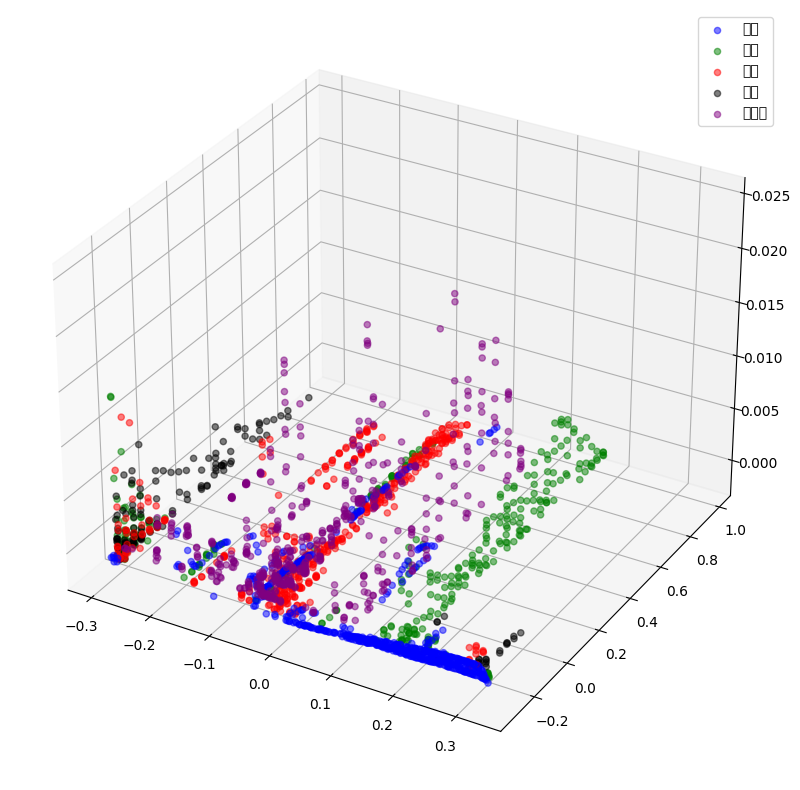

In [ ]:
def visualize_data(point_cloud, labels):
    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    ax.legend()
    plt.show()


visualize_data(point_clouds[0], all_labels[0])

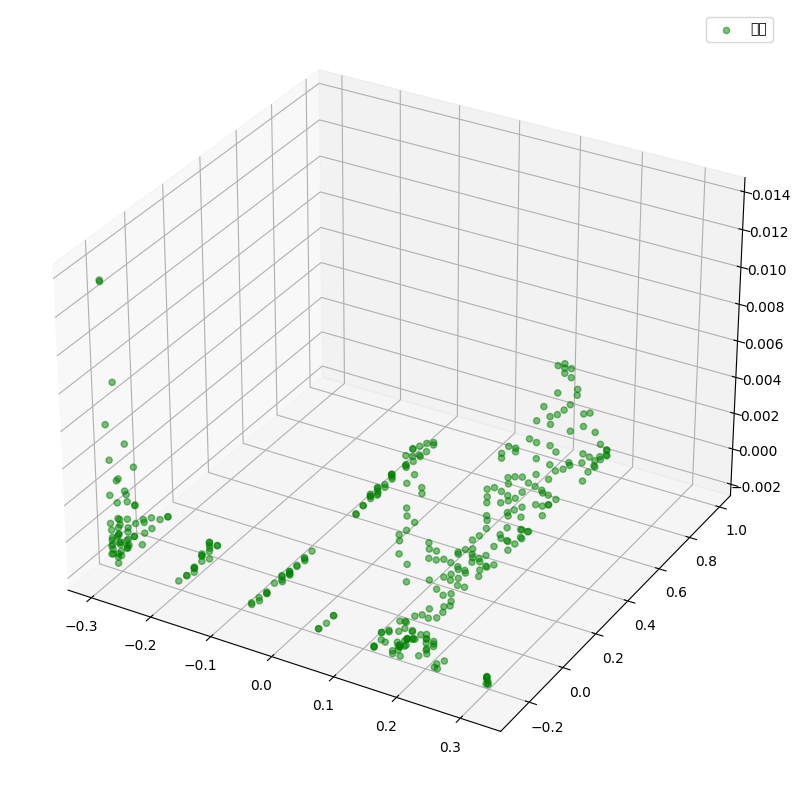

In [ ]:
def visualize_data1(point_cloud, labels):
    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="green":
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    ax.legend()
    plt.show()
visualize_data1(point_clouds[0], all_labels[0])


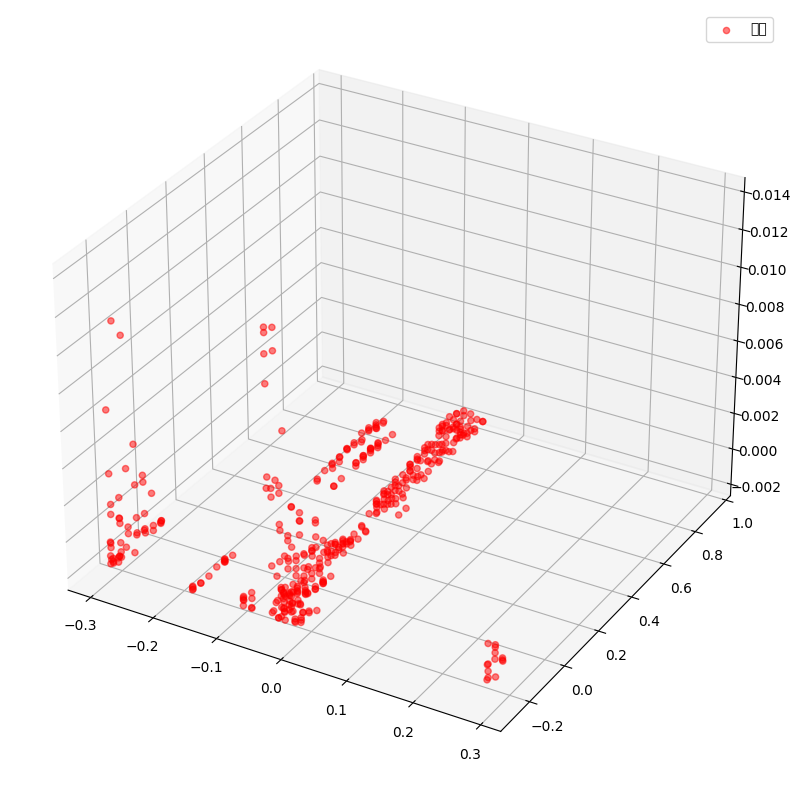

In [ ]:
def visualize_data2(point_cloud, labels):
    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="red":
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    ax.legend()
    plt.show()
visualize_data2(point_clouds[0], all_labels[0])

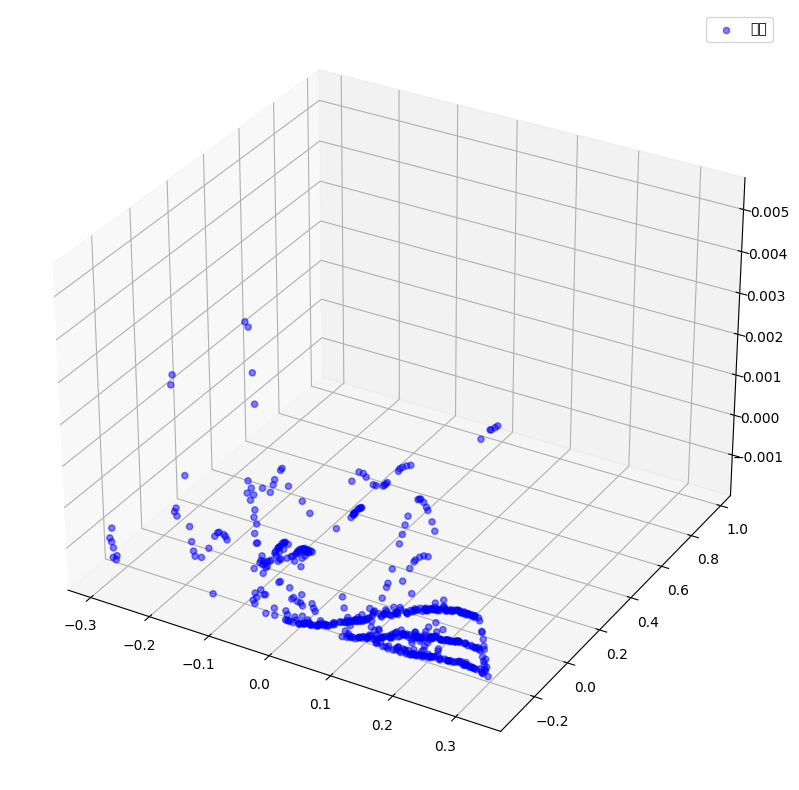

In [ ]:
def visualize_data3(point_cloud, labels):
    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="blue":
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    ax.legend()
    plt.show()

visualize_data3(point_clouds[0], all_labels[0])

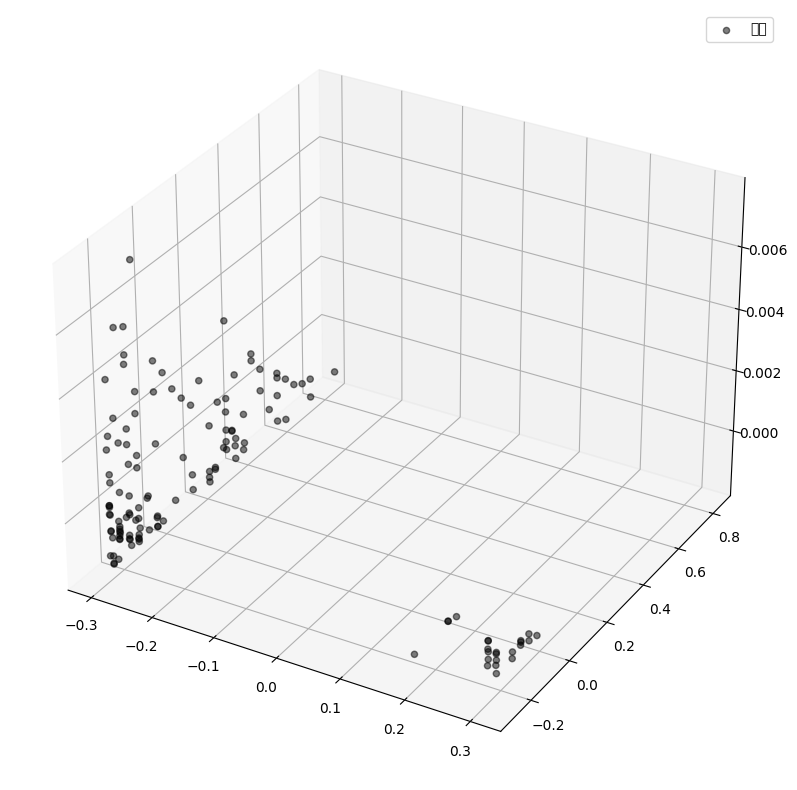

In [ ]:
def visualize_data4(point_cloud, labels):
    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="black":
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    ax.legend()
    plt.show()

visualize_data4(point_clouds[0], all_labels[0])

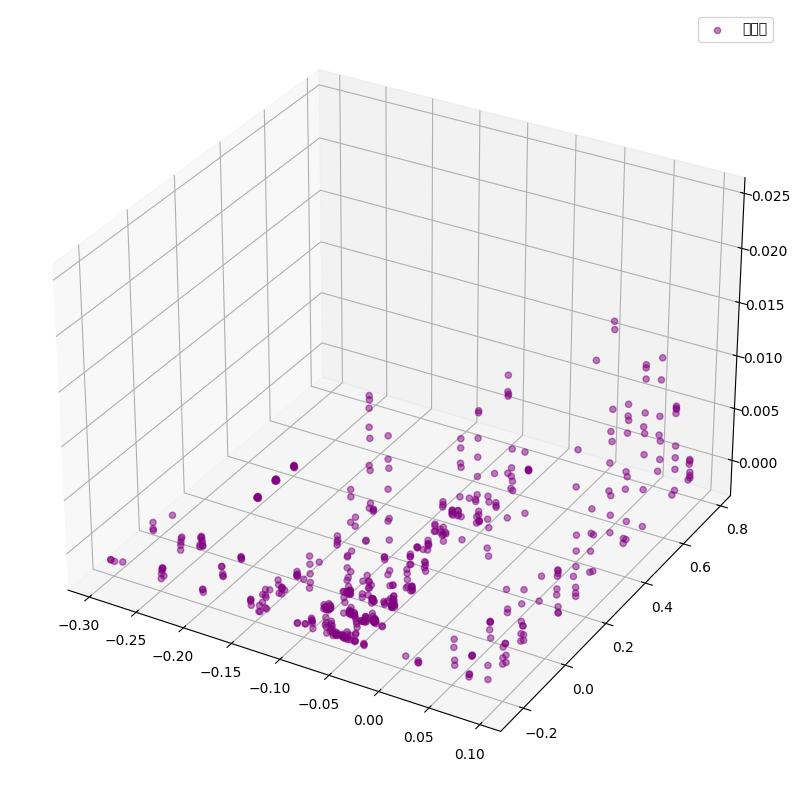

In [ ]:
def visualize_data5(point_cloud, labels):
    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="purple":
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    ax.legend()
    plt.show()
visualize_data5(point_clouds[0], all_labels[0])


## 儲存(第一次才需執行)

In [ ]:
np.save(os.path.join(directory, 'point_clouds_thres_0.1_5kind_points2048.npy'), point_clouds)
np.save(os.path.join(directory, 'point_cloud_labels_thres_0.1_5kind_points2048.npy'), point_cloud_labels)
np.save(os.path.join(directory, 'all_labels_thres_0.1_5kind_points2048.npy'), all_labels)

## Train cuda


In [ ]:
import cupy as cp
import tensorflow as tf

# Create the array directly as a CuPy array
cp_float_array = cp.array([
    [2.6, 189.458, 0.0141635998889819],
    [2.683333, 189.458, 1.3457694251028385],
    [2.766667, 189.458, 1.361028376630685],
    [29.56667, 361.85, 0.0110500474521696],
    [29.58333, 362.802, 0.0121339682418608],
    [39.18333, 363.797, 0.0113169617175544]
], dtype=cp.float32)

# Create a TensorFlow session and specify the GPU device
with tf.device('/gpu:0'):  # Replace '/gpu:0' with the ID of your GPU device
    # Convert the CuPy array to a TensorFlow tensor
    tensor = tf.convert_to_tensor(cp_float_array.get(), dtype=tf.float32)

print("CuPy array:")
print(cp_float_array)

print("\nTensorFlow tensor:")
print(tensor)

In [ ]:
import cupy as cp
import tensorflow as tf

def load_data(point_cloud_batch, label_cloud_batch):
    point_cloud_batch.set_shape([NUM_SAMPLE_POINTS, 3])
    label_cloud_batch.set_shape([NUM_SAMPLE_POINTS, len(LABELS) + 1])
    return point_cloud_batch, label_cloud_batch


def augment(point_cloud_batch, label_cloud_batch):
    noise = tf.random.uniform(
        tf.shape(label_cloud_batch), -0.005, 0.005, dtype=tf.float32
    )
    point_cloud_batch += noise[:, :, :3]
    return point_cloud_batch, label_cloud_batch

def generate_dataset(point_clouds, label_clouds, is_training=True):
    # Convert to TensorFlow tensors directly on the GPU
    with tf.device('/GPU:0'): # Assuming you want to use GPU:0
        point_clouds = tf.convert_to_tensor(point_clouds, dtype=tf.float32)
        label_clouds = tf.convert_to_tensor(label_clouds, dtype=tf.float32)

        dataset = tf.data.Dataset.from_tensor_slices((point_clouds, label_clouds))
        dataset = dataset.shuffle(BATCH_SIZE * 100) if is_training else dataset
        dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
        dataset = dataset.batch(batch_size=BATCH_SIZE)
        dataset = (
            dataset.map(augment, num_parallel_calls=tf.data.AUTOTUNE)
            if is_training
            else dataset
        )
    return dataset



split_index = int(len(point_clouds) * (1 - VAL_SPLIT))
train_point_clouds = point_clouds[:split_index]
train_label_cloud = point_cloud_labels[:split_index]
total_training_examples = len(train_point_clouds)

val_point_clouds = point_clouds[split_index:]
val_label_cloud = point_cloud_labels[split_index:]

print("Num train point clouds:", len(train_point_clouds))
print("Num train point cloud labels:", len(train_label_cloud))
print("Num val point clouds:", len(val_point_clouds))
print("Num val point cloud labels:", len(val_label_cloud))

train_dataset = generate_dataset(train_point_clouds, train_label_cloud)
val_dataset = generate_dataset(val_point_clouds, val_label_cloud, is_training=False)

print("Train Dataset:", train_dataset)
print("Validation Dataset:", val_dataset)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Decorator for GPU placement
def gpu_scope(func):
    def wrapper(*args, **kwargs):
        with tf.device('/gpu:0'):  # Replace with your GPU ID if needed
            return func(*args, **kwargs)
    return wrapper

@gpu_scope
def conv_block(x: tf.Tensor, filters: int, name: str) -> tf.Tensor:
    x = layers.Conv1D(filters, kernel_size=1, padding="valid", name=f"{name}_conv")(x)
    x = layers.BatchNormalization(momentum=0.0, name=f"{name}_batch_norm")(x)
    return layers.Activation("relu", name=f"{name}_relu")(x)


@gpu_scope
def mlp_block(x: tf.Tensor, filters: int, name: str) -> tf.Tensor:
    x = layers.Dense(filters, name=f"{name}_dense")(x)
    x = layers.BatchNormalization(momentum=0.0, name=f"{name}_batch_norm")(x)
    return layers.Activation("relu", name=f"{name}_relu")(x)

# Now, any call to conv_block or mlp_block will be automatically within the GPU scope.

In [ ]:
class OrthogonalRegularizer(keras.regularizers.Regularizer):
    """Reference: https://keras.io/examples/vision/pointnet/#build-a-model"""

    def __init__(self, num_features, l2reg=0.001):
        self.num_features = num_features
        self.l2reg = l2reg
        self.identity = tf.eye(num_features)

    def __call__(self, x):
        x = tf.reshape(x, (-1, self.num_features, self.num_features))
        xxt = tf.tensordot(x, x, axes=(2, 2))
        xxt = tf.reshape(xxt, (-1, self.num_features, self.num_features))
        return tf.reduce_sum(self.l2reg * tf.square(xxt - self.identity))

    def get_config(self):
        config = super().get_config()
        config.update({"num_features": self.num_features, "l2reg_strength": self.l2reg})
        return config

In [ ]:
def transformation_net(inputs: tf.Tensor, num_features: int, name: str) -> tf.Tensor:
    """
    Reference: https://keras.io/examples/vision/pointnet/#build-a-model.

    The `filters` values come from the original paper:
    https://arxiv.org/abs/1612.00593.
    """
    x = conv_block(inputs, filters=64, name=f"{name}_1")
    x = conv_block(x, filters=128, name=f"{name}_2")
    x = conv_block(x, filters=1024, name=f"{name}_3")
    x = layers.GlobalMaxPooling1D()(x)
    x = mlp_block(x, filters=512, name=f"{name}_1_1")
    x = mlp_block(x, filters=256, name=f"{name}_2_1")
    return layers.Dense(
        num_features * num_features,
        kernel_initializer="zeros",
        bias_initializer=keras.initializers.Constant(np.eye(num_features).flatten()),
        activity_regularizer=OrthogonalRegularizer(num_features),
        name=f"{name}_final",
    )(x)


def transformation_block(inputs: tf.Tensor, num_features: int, name: str) -> tf.Tensor:
    transformed_features = transformation_net(inputs, num_features, name=name)
    transformed_features = layers.Reshape((num_features, num_features))(
        transformed_features
    )
    return layers.Dot(axes=(2, 1), name=f"{name}_mm")([inputs, transformed_features])

In [ ]:
def get_shape_segmentation_model(num_points: int, num_classes: int) -> keras.Model:
    input_points = keras.Input(shape=(None, 3))

    # PointNet Classification Network.
    transformed_inputs = transformation_block(
        input_points, num_features=3, name="input_transformation_block"
    )
    features_64 = conv_block(transformed_inputs, filters=64, name="features_64")
    features_128_1 = conv_block(features_64, filters=128, name="features_128_1")
    features_128_2 = conv_block(features_128_1, filters=128, name="features_128_2")
    transformed_features = transformation_block(
        features_128_2, num_features=128, name="transformed_features"
    )
    features_512 = conv_block(transformed_features, filters=512, name="features_512")
    features_2048 = conv_block(features_512, filters=2048, name="pre_maxpool_block")
    global_features = layers.MaxPool1D(pool_size=num_points, name="global_features")(
        features_2048
    )
    global_features = tf.tile(global_features, [1, num_points, 1])

    # Segmentation head.
    segmentation_input = layers.Concatenate(name="segmentation_input")(
        [
            features_64,
            features_128_1,
            features_128_2,
            transformed_features,
            features_512,
            global_features,
        ]
    )
    segmentation_features = conv_block(
        segmentation_input, filters=128, name="segmentation_features"
    )
    outputs = layers.Conv1D(
        num_classes, kernel_size=1, activation="softmax", name="segmentation_head"
    )(segmentation_features)
    return keras.Model(input_points, outputs)

In [ ]:
x, y = next(iter(train_dataset))

num_points = x.shape[1]
num_classes = y.shape[-1]

segmentation_model = get_shape_segmentation_model(num_points, num_classes)
segmentation_model.summary()

In [ ]:
training_step_size = total_training_examples // BATCH_SIZE
total_training_steps = training_step_size * EPOCHS
print(f"Total training steps: {total_training_steps}.")

lr_schedule = keras.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=[training_step_size * 15, training_step_size * 15],
    values=[INITIAL_LR, INITIAL_LR * 0.5, INITIAL_LR * 0.25],
)

steps = tf.range(total_training_steps, dtype=tf.int32)
# lrs = [lr_schedule(step) for step in steps]
lrs = [INITIAL_LR for step in steps]

plt.plot(lrs)
plt.xlabel("Steps")
plt.ylabel("Learning Rate")
plt.show()

In [ ]:
def run_experiment(epochs):
    segmentation_model = get_shape_segmentation_model(num_points, num_classes)
    segmentation_model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=INITIAL_LR),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy"],
    )

    checkpoint_filepath = "/tmp/checkpoint"
    checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor="val_loss",
        save_best_only=True,
        save_weights_only=True,
    )

    history = segmentation_model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=epochs,
        callbacks=[checkpoint_callback],
    )

    segmentation_model.load_weights(checkpoint_filepath)
    return segmentation_model, history


segmentation_model, history = run_experiment(epochs=EPOCHS)

## Train cpu


In [ ]:
import numpy as np
import tensorflow as tf

# Your initial NumPy ndarray
initial_array = np.array([
    ['2.6', '189.458', 0.0141635998889819],
    ['2.683333', '189.458', 1.3457694251028385],
    ['2.766667', '189.458', 1.361028376630685],
    ['29.56667', '361.85', 0.0110500474521696],
    ['29.58333', '362.802', 0.0121339682418608],
    [39.18333, '363.797', 0.0113169617175544]
], dtype=object)

# Convert all elements to float
float_array = initial_array.astype(float)

# Convert the float_array to a TensorFlow tensor
tensor = tf.convert_to_tensor(float_array, dtype=tf.float32)

print("NumPy ndarray:")
print(float_array)

print("\nTensorFlow tensor:")
print(tensor)

NumPy ndarray:
[[2.60000000e+00 1.89458000e+02 1.41635999e-02]
 [2.68333300e+00 1.89458000e+02 1.34576943e+00]
 [2.76666700e+00 1.89458000e+02 1.36102838e+00]
 [2.95666700e+01 3.61850000e+02 1.10500475e-02]
 [2.95833300e+01 3.62802000e+02 1.21339682e-02]
 [3.91833300e+01 3.63797000e+02 1.13169617e-02]]

TensorFlow tensor:
tf.Tensor(
[[2.5999999e+00 1.8945799e+02 1.4163600e-02]
 [2.6833329e+00 1.8945799e+02 1.3457694e+00]
 [2.7666669e+00 1.8945799e+02 1.3610284e+00]
 [2.9566669e+01 3.6185001e+02 1.1050047e-02]
 [2.9583330e+01 3.6280200e+02 1.2133968e-02]
 [3.9183331e+01 3.6379700e+02 1.1316962e-02]], shape=(6, 3), dtype=float32)


In [ ]:
def load_data(point_cloud_batch, label_cloud_batch):
    point_cloud_batch.set_shape([NUM_SAMPLE_POINTS, 3])
    label_cloud_batch.set_shape([NUM_SAMPLE_POINTS, len(LABELS) + 1])

    # label_cloud_batch.set_shape([NUM_SAMPLE_POINTS, 3 + 1])
    return point_cloud_batch, label_cloud_batch


def augment(point_cloud_batch, label_cloud_batch):
    noise = tf.random.uniform(
        tf.shape(label_cloud_batch), -0.0005, 0.0005, dtype=tf.float64
    )
    point_cloud_batch += noise[:, :, :3]
    return point_cloud_batch, label_cloud_batch


def generate_dataset(point_clouds, label_clouds, is_training=True):
    # point_clouds = tf.convert_to_tensor(point_clouds.astype(float))
    # print(point_clouds)
    dataset = tf.data.Dataset.from_tensor_slices((point_clouds, label_clouds))
    dataset = dataset.shuffle(BATCH_SIZE * 100) if is_training else dataset
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size=BATCH_SIZE)
    dataset = (
        dataset.map(augment, num_parallel_calls=tf.data.AUTOTUNE)
        if is_training
        else dataset
    )
    return dataset


split_index = int(len(point_clouds) * (1 - VAL_SPLIT))
train_point_clouds = point_clouds[:split_index]
train_label_cloud = point_cloud_labels[:split_index]
total_training_examples = len(train_point_clouds)

val_point_clouds = point_clouds[split_index:]
val_label_cloud = point_cloud_labels[split_index:]

print("Num train point clouds:", len(train_point_clouds))
print("Num train point cloud labels:", len(train_label_cloud))
print("Num val point clouds:", len(val_point_clouds))
print("Num val point cloud labels:", len(val_label_cloud))

train_dataset = generate_dataset(train_point_clouds, train_label_cloud)
val_dataset = generate_dataset(val_point_clouds, val_label_cloud, is_training=False)

print("Train Dataset:", train_dataset)
print("Validation Dataset:", val_dataset)

Num train point clouds: 170
Num train point cloud labels: 170
Num val point clouds: 30
Num val point cloud labels: 30
Train Dataset: <_ParallelMapDataset element_spec=(TensorSpec(shape=(None, 2048, 3), dtype=tf.float64, name=None), TensorSpec(shape=(None, 2048, 6), dtype=tf.float64, name=None))>
Validation Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(None, 2048, 3), dtype=tf.float64, name=None), TensorSpec(shape=(None, 2048, 6), dtype=tf.float64, name=None))>


In [ ]:
def conv_block(x: tf.Tensor, filters: int, name: str) -> tf.Tensor:
    x = layers.Conv1D(filters, kernel_size=1, padding="valid", name=f"{name}_conv")(x)
    x = layers.BatchNormalization(momentum=0.0, name=f"{name}_batch_norm")(x)
    return layers.Activation("relu", name=f"{name}_relu")(x)


def mlp_block(x: tf.Tensor, filters: int, name: str) -> tf.Tensor:
    x = layers.Dense(filters, name=f"{name}_dense")(x)
    x = layers.BatchNormalization(momentum=0.0, name=f"{name}_batch_norm")(x)
    return layers.Activation("relu", name=f"{name}_relu")(x)

In [ ]:
class OrthogonalRegularizer(keras.regularizers.Regularizer):
    """Reference: https://keras.io/examples/vision/pointnet/#build-a-model"""

    def __init__(self, num_features, l2reg=0.001):
        self.num_features = num_features
        self.l2reg = l2reg
        self.identity = tf.eye(num_features)

    def __call__(self, x):
        x = tf.reshape(x, (-1, self.num_features, self.num_features))
        xxt = tf.tensordot(x, x, axes=(2, 2))
        xxt = tf.reshape(xxt, (-1, self.num_features, self.num_features))
        return tf.reduce_sum(self.l2reg * tf.square(xxt - self.identity))

    def get_config(self):
        config = super().get_config()
        config.update({"num_features": self.num_features, "l2reg_strength": self.l2reg})
        return config


In [ ]:
def transformation_net(inputs: tf.Tensor, num_features: int, name: str) -> tf.Tensor:
    """
    Reference: https://keras.io/examples/vision/pointnet/#build-a-model.

    The `filters` values come from the original paper:
    https://arxiv.org/abs/1612.00593.
    """
    x = conv_block(inputs, filters=64, name=f"{name}_1")
    x = conv_block(x, filters=128, name=f"{name}_2")
    x = conv_block(x, filters=1024, name=f"{name}_3")
    x = layers.GlobalMaxPooling1D()(x)
    x = mlp_block(x, filters=512, name=f"{name}_1_1")
    x = mlp_block(x, filters=256, name=f"{name}_2_1")
    return layers.Dense(
        num_features * num_features,
        kernel_initializer="zeros",
        bias_initializer=keras.initializers.Constant(np.eye(num_features).flatten()),
        activity_regularizer=OrthogonalRegularizer(num_features),
        name=f"{name}_final",
    )(x)


def transformation_block(inputs: tf.Tensor, num_features: int, name: str) -> tf.Tensor:
    transformed_features = transformation_net(inputs, num_features, name=name)
    transformed_features = layers.Reshape((num_features, num_features))(
        transformed_features
    )
    return layers.Dot(axes=(2, 1), name=f"{name}_mm")([inputs, transformed_features])


In [ ]:
def get_shape_segmentation_model(num_points: int, num_classes: int) -> keras.Model:
    input_points = keras.Input(shape=(None, 3))

    # PointNet Classification Network.
    transformed_inputs = transformation_block(
        input_points, num_features=3, name="input_transformation_block"
    )
    features_64 = conv_block(transformed_inputs, filters=64, name="features_64")
    features_128_1 = conv_block(features_64, filters=128, name="features_128_1")
    features_128_2 = conv_block(features_128_1, filters=128, name="features_128_2")
    transformed_features = transformation_block(
        features_128_2, num_features=128, name="transformed_features"
    )
    features_512 = conv_block(transformed_features, filters=512, name="features_512")
    features_2048 = conv_block(features_512, filters=2048, name="pre_maxpool_block")
    global_features = layers.MaxPool1D(pool_size=num_points, name="global_features")(
        features_2048
    )
    global_features = tf.tile(global_features, [1, num_points, 1])

    # Segmentation head.
    segmentation_input = layers.Concatenate(name="segmentation_input")(
        [
            features_64,
            features_128_1,
            features_128_2,
            transformed_features,
            features_512,
            global_features,
        ]
    )
    segmentation_features = conv_block(
        segmentation_input, filters=128, name="segmentation_features"
    )
    outputs = layers.Conv1D(
        num_classes, kernel_size=1, activation="softmax", name="segmentation_head"
    )(segmentation_features)
    return keras.Model(input_points, outputs)


In [ ]:
x, y = next(iter(train_dataset))

num_points = x.shape[1]
num_classes = y.shape[-1]

segmentation_model = get_shape_segmentation_model(num_points, num_classes)
segmentation_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, 3)]            0         []                            
                                                                                                  
 input_transformation_block  (None, None, 64)             256       ['input_2[0][0]']             
 _1_conv (Conv1D)                                                                                 
                                                                                                  
 input_transformation_block  (None, None, 64)             256       ['input_transformation_block_1
 _1_batch_norm (BatchNormal                                         _conv[0][0]']                 
 ization)                                                                                   

Total training steps: 1000.


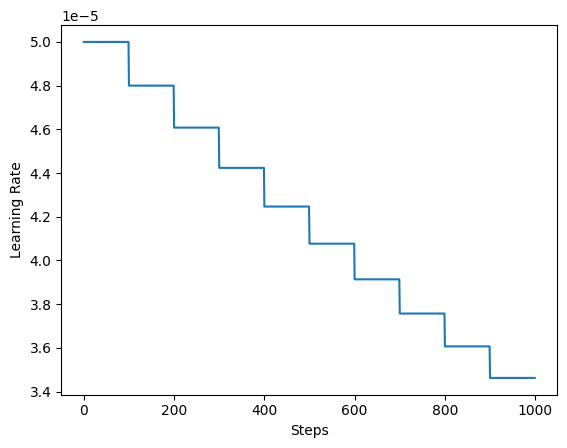

In [ ]:
training_step_size = total_training_examples // BATCH_SIZE
total_training_steps = training_step_size * EPOCHS
print(f"Total training steps: {total_training_steps}.")

# lr_schedule = keras.optimizers.schedules.PiecewiseConstantDecay(
#     boundaries=[training_step_size * 15, training_step_size * 15],
#     values=[INITIAL_LR, INITIAL_LR * 0.5, INITIAL_LR * 0.25],
# )
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=INITIAL_LR,
    decay_steps=100,
    decay_rate=0.96,
    staircase=True
)

steps = tf.range(total_training_steps, dtype=tf.int32)
lrs = [lr_schedule(step) for step in steps]
# lrs = [INITIAL_LR for step in steps]

plt.plot(lrs)
plt.xlabel("Steps")
plt.ylabel("Learning Rate")
plt.show()

## original model

In [ ]:
# EPOCHS = 2
def run_experiment(epochs):

    segmentation_model = get_shape_segmentation_model(num_points, num_classes)
    segmentation_model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=lr_schedule),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy"],
    )

    checkpoint_filepath = "/tmp/checkpoint"
    checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor="val_loss",
        save_best_only=True,
        save_weights_only=True,
    )

    history = segmentation_model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=epochs,
        callbacks=[checkpoint_callback],
    )

    segmentation_model.load_weights(checkpoint_filepath)
    return segmentation_model, history


segmentation_model, history = run_experiment(epochs=EPOCHS)

Epoch 1/200
6/6 [==============================] - 34s 2s/step - loss: 9.7260 - accuracy: 0.2700 - val_loss: 9.0081 - val_accuracy: 0.3982
Epoch 2/200
6/6 [==============================] - 4s 745ms/step - loss: 8.9109 - accuracy: 0.4773 - val_loss: 8.4915 - val_accuracy: 0.5111
Epoch 3/200
6/6 [==============================] - 4s 696ms/step - loss: 8.3344 - accuracy: 0.5649 - val_loss: 7.8856 - val_accuracy: 0.5558
Epoch 4/200
6/6 [==============================] - 4s 692ms/step - loss: 7.8453 - accuracy: 0.5954 - val_loss: 7.2817 - val_accuracy: 0.5747
Epoch 5/200
6/6 [==============================] - 4s 706ms/step - loss: 7.4229 - accuracy: 0.6239 - val_loss: 7.1244 - val_accuracy: 0.5291
Epoch 6/200
6/6 [==============================] - 4s 696ms/step - loss: 7.0840 - accuracy: 0.6363 - val_loss: 6.8814 - val_accuracy: 0.5537
Epoch 7/200
6/6 [==============================] - 4s 739ms/step - loss: 6.7863 - accuracy: 0.6445 - val_loss: 6.3516 - val_accuracy: 0.6226
Epoch 8/200
6/6

## Result visualization

### 600 epochs,4096點

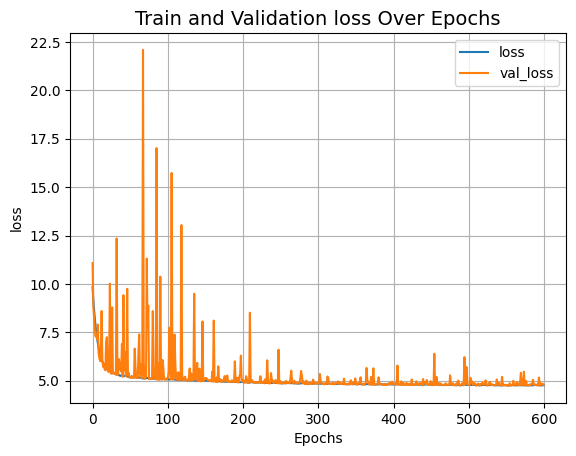

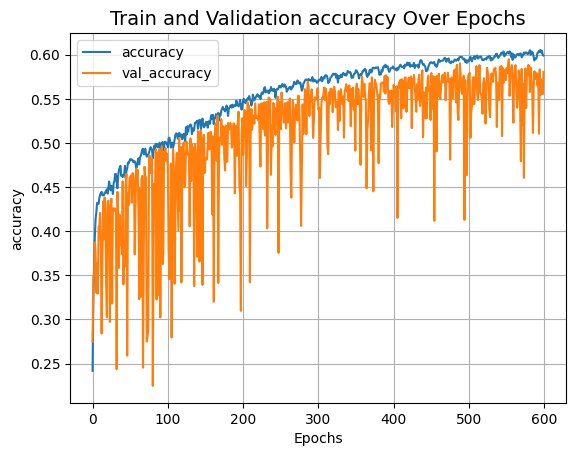

In [ ]:
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


plot_result("loss")
plot_result("accuracy")

In [ ]:
validation_batch = next(iter(val_dataset))
val_predictions = segmentation_model.predict(validation_batch[0])
print(f"Validation prediction shape: {val_predictions.shape}")


def visualize_single_point_cloud(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud1(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data1(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud2(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data2(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud3(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data3(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud4(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data4(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud5(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data5(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])


idx = np.random.choice(len(validation_batch[0]))
print(f"Index selected: {idx}")

# Plotting with ground-truth.
visualize_single_point_cloud(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud(validation_batch[0], val_predictions, idx)

# Plotting with ground-truth.
visualize_single_point_cloud1(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud1(validation_batch[0], val_predictions, idx)

# Plotting with ground-truth.
visualize_single_point_cloud2(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud2(validation_batch[0], val_predictions, idx)

# Plotting with ground-truth.
visualize_single_point_cloud3(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud3(validation_batch[0], val_predictions, idx)

visualize_single_point_cloud4(validation_batch[0], validation_batch[1], idx)
visualize_single_point_cloud4(validation_batch[0], val_predictions, idx)

visualize_single_point_cloud5(validation_batch[0], validation_batch[1], idx)
visualize_single_point_cloud5(validation_batch[0], val_predictions, idx)



### 400 epochs,2048點

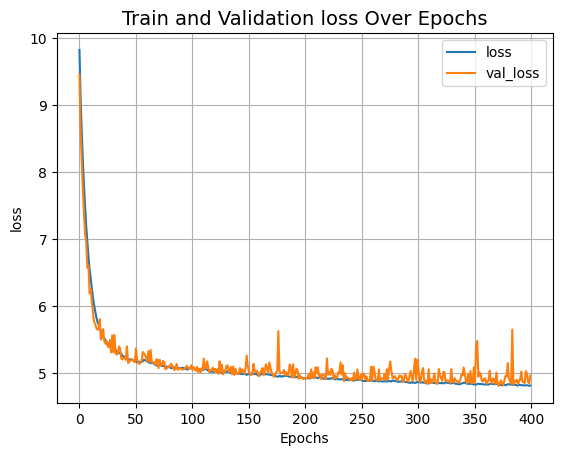

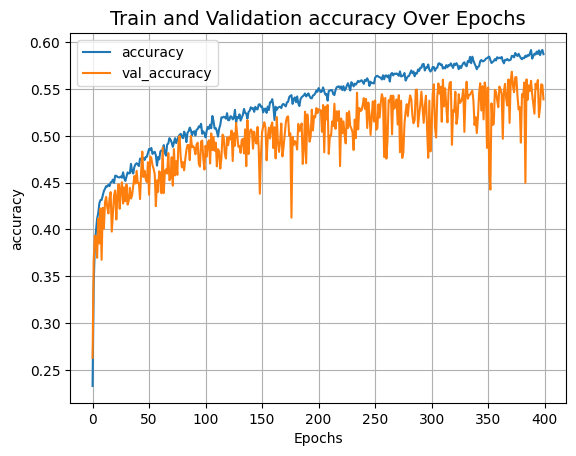

In [ ]:
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


plot_result("loss")
plot_result("accuracy")

In [ ]:
validation_batch = next(iter(val_dataset))
val_predictions = segmentation_model.predict(validation_batch[0])
print(f"Validation prediction shape: {val_predictions.shape}")


def visualize_single_point_cloud(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud1(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data1(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud2(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data2(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud3(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data3(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud4(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data4(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud5(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data5(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])


idx = np.random.choice(len(validation_batch[0]))
print(f"Index selected: {idx}")

# Plotting with ground-truth.
visualize_single_point_cloud(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud(validation_batch[0], val_predictions, idx)

# Plotting with ground-truth.
visualize_single_point_cloud1(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud1(validation_batch[0], val_predictions, idx)

# Plotting with ground-truth.
visualize_single_point_cloud2(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud2(validation_batch[0], val_predictions, idx)

# Plotting with ground-truth.
visualize_single_point_cloud3(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud3(validation_batch[0], val_predictions, idx)

visualize_single_point_cloud4(validation_batch[0], validation_batch[1], idx)
visualize_single_point_cloud4(validation_batch[0], val_predictions, idx)

visualize_single_point_cloud5(validation_batch[0], validation_batch[1], idx)
visualize_single_point_cloud5(validation_batch[0], val_predictions, idx)



In [ ]:
directory = '/content/drive/MyDrive/重要的東西_先別刪/增幅資料生成/data_csv/'

point_clouds_result = []
labels_result = []
point_clouds1 = []
point_clouds2 = []
point_clouds3 = []

COLORS = ['blue', 'green', 'red' ,'black' , 'purple']

def save_data(point_cloud, labels):


    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        c_df = c_df.drop('label',axis = 1)
        print(c_df)
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="blue":
            point_clouds_result.append(c_df)
            labels_result.append(0)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
          if COLORS[index]=="green":
            point_clouds_result.append(c_df)
            labels_result.append(1)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
          if COLORS[index]=="red":
            point_clouds_result.append(c_df)
            labels_result.append(2)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
          if COLORS[index]=="black":
            point_clouds_result.append(c_df)
            labels_result.append(3)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
          if COLORS[index]=="purple":
            point_clouds_result.append(c_df)
            labels_result.append(4)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    print(point_clouds1)
    ax.legend()
    plt.show()

def save_data1(point_cloud, labels):


    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="blue":
            point_clouds1.append(c_df)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    print(point_clouds1)
    ax.legend()
    plt.show()
def save_data2(point_cloud, labels):

    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="green":
            point_clouds2.append(c_df)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    print(point_clouds2)
    ax.legend()
    plt.show()
def save_data3(point_cloud, labels):

    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="red":
            point_clouds3.append(c_df)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    print(point_clouds3)
    ax.legend()
    plt.show()


def save_all_data(point_clouds, label_clouds):
    label_map = LABELS + ["none"]
    for idx in range(len(point_clouds)):
      point_cloud = point_clouds[idx]
      label_cloud = label_clouds[idx]
      # save_data1(point_cloud,[label_map[np.argmax(label)] for label in label_cloud])
      # save_data2(point_cloud,[label_map[np.argmax(label)] for label in label_cloud])
      # save_data3(point_cloud,[label_map[np.argmax(label)] for label in label_cloud])
      save_data(point_cloud,[label_map[np.argmax(label)] for label in label_cloud])

save_all_data(validation_batch[0], val_predictions)

# np.save(os.path.join(directory, 'point_clouds_predict1.npy'), point_clouds1)
# np.save(os.path.join(directory, 'point_clouds_predict2.npy'), point_clouds2)
# np.save(os.path.join(directory, 'point_clouds_predict3.npy'), point_clouds3)


### 200 epochs,2048點

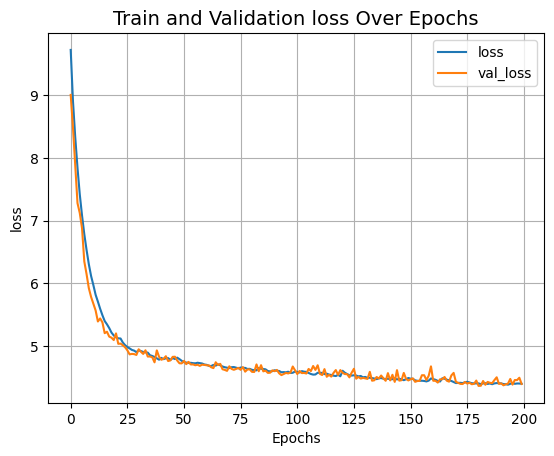

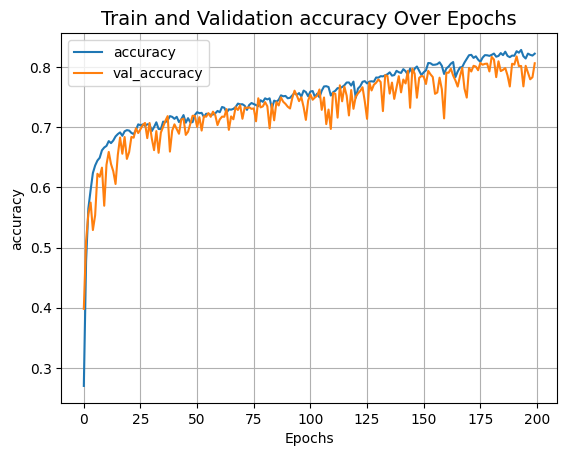

In [ ]:
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


plot_result("loss")
plot_result("accuracy")

1/1 [==============================] - 1s 1s/step
Validation prediction shape: (30, 2048, 6)
Index selected: 1


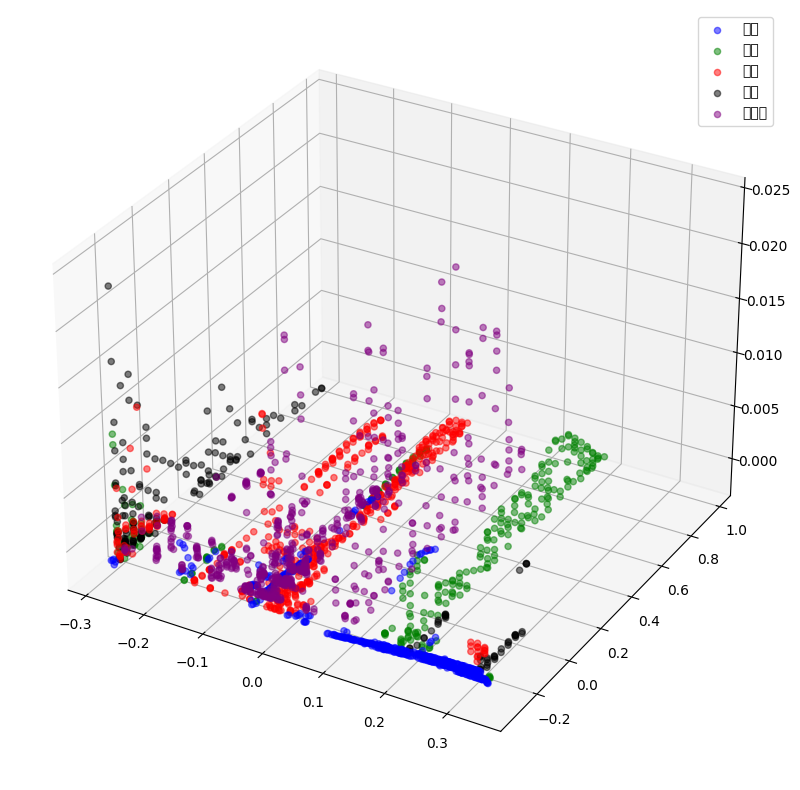

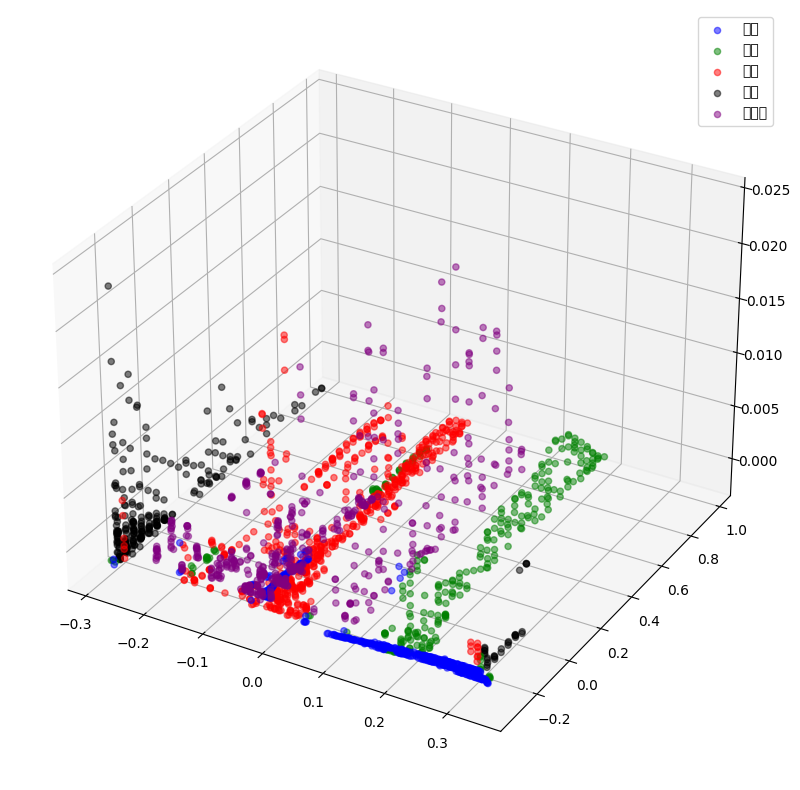

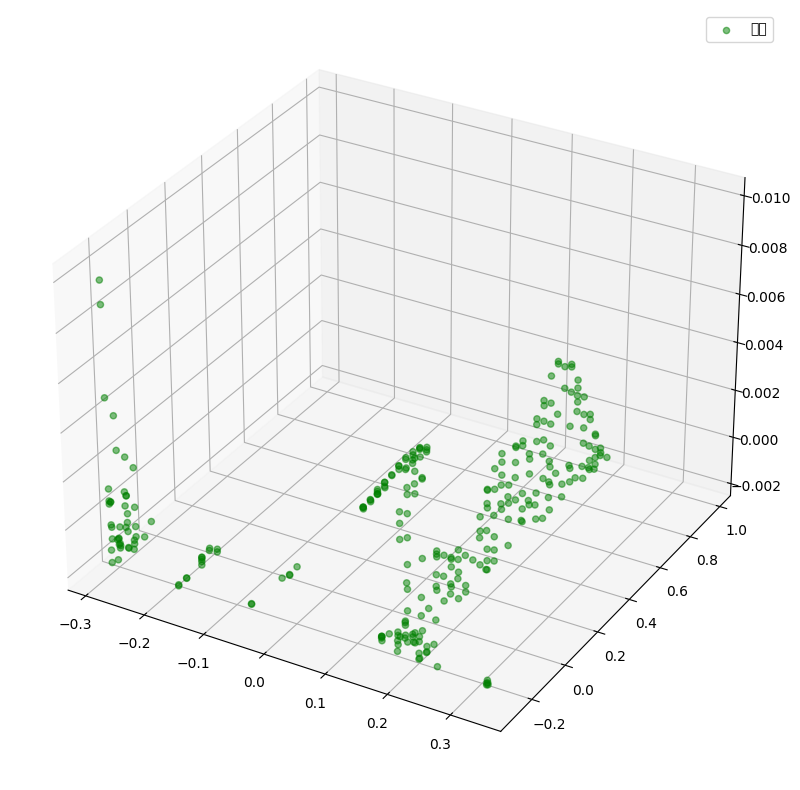

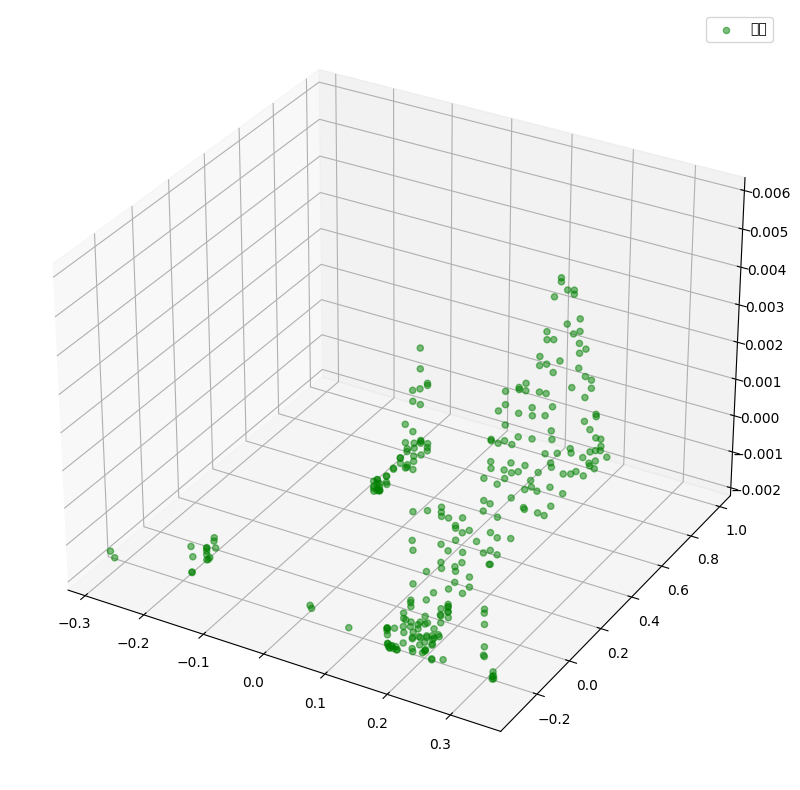

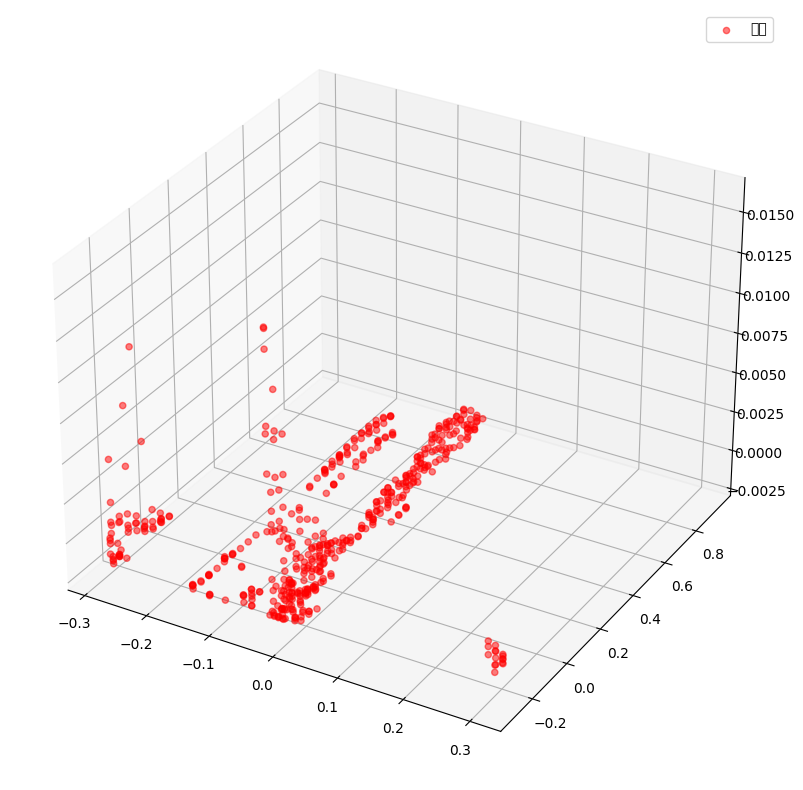

...

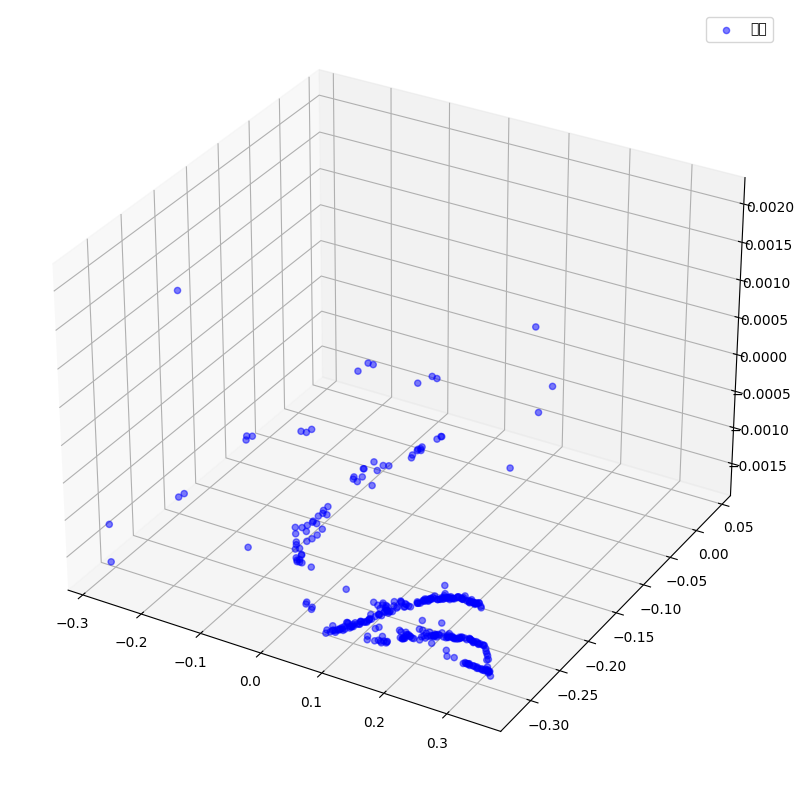

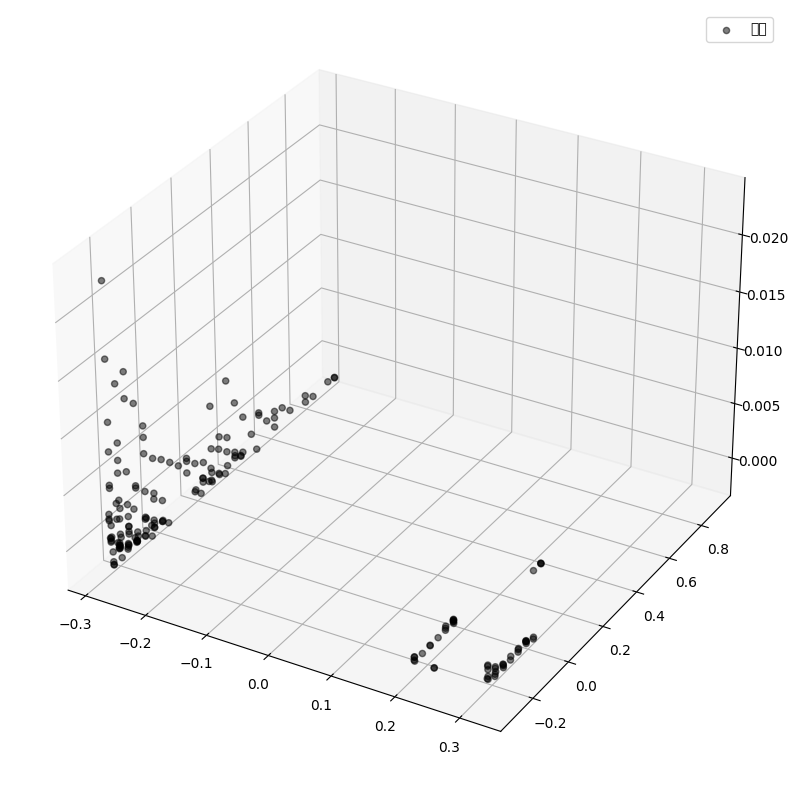

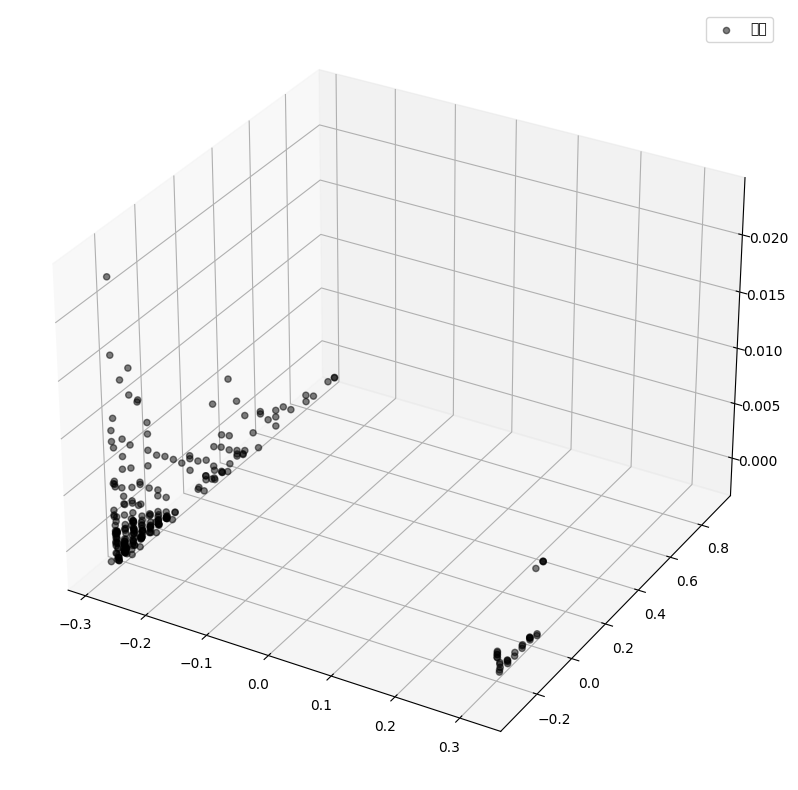

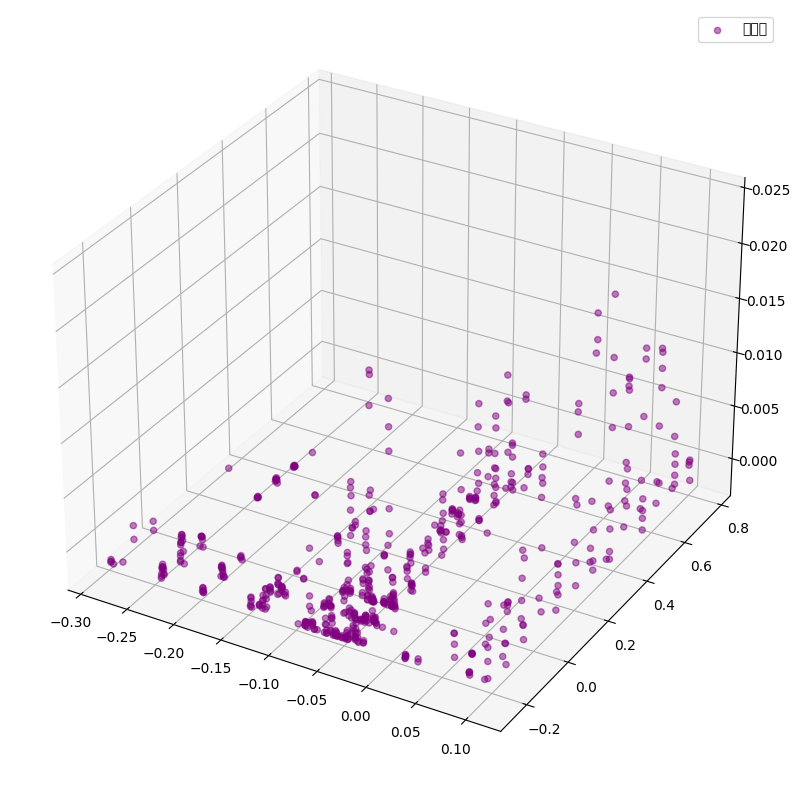

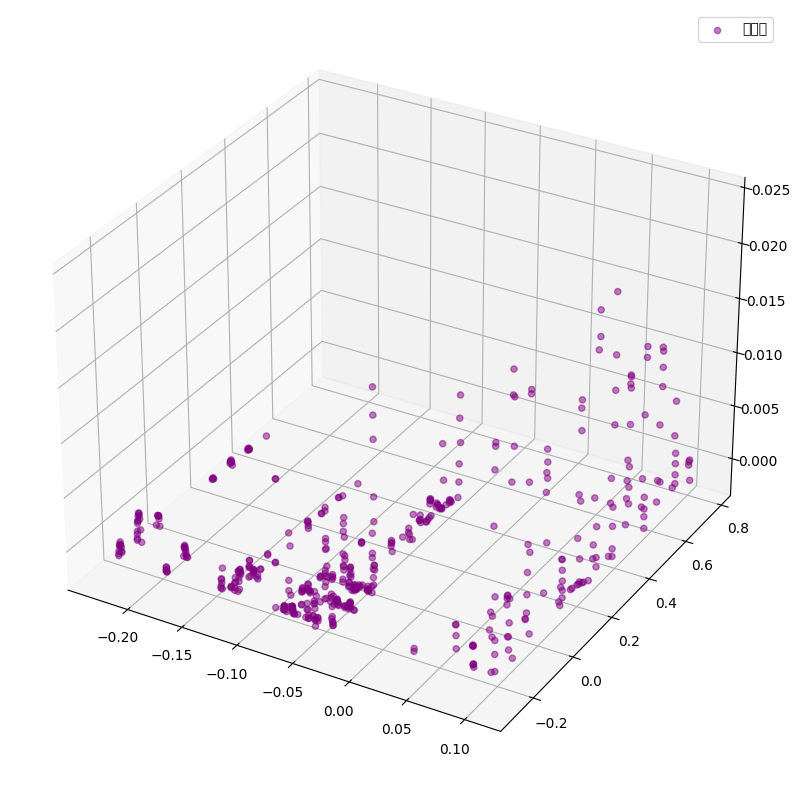

In [ ]:
validation_batch = next(iter(val_dataset))
val_predictions = segmentation_model.predict(validation_batch[0])
print(f"Validation prediction shape: {val_predictions.shape}")


def visualize_single_point_cloud(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud1(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data1(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud2(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data2(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud3(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data3(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud4(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data4(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])

def visualize_single_point_cloud5(point_clouds, label_clouds, idx):
    label_map = LABELS + ["none"]
    point_cloud = point_clouds[idx]
    label_cloud = label_clouds[idx]
    visualize_data5(point_cloud, [label_map[np.argmax(label)] for label in label_cloud])


idx = np.random.choice(len(validation_batch[0]))
print(f"Index selected: {idx}")

# Plotting with ground-truth.
visualize_single_point_cloud(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud(validation_batch[0], val_predictions, idx)

# Plotting with ground-truth.
visualize_single_point_cloud1(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud1(validation_batch[0], val_predictions, idx)

# Plotting with ground-truth.
visualize_single_point_cloud2(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud2(validation_batch[0], val_predictions, idx)

# Plotting with ground-truth.
visualize_single_point_cloud3(validation_batch[0], validation_batch[1], idx)

# Plotting with predicted labels.
visualize_single_point_cloud3(validation_batch[0], val_predictions, idx)

visualize_single_point_cloud4(validation_batch[0], validation_batch[1], idx)
visualize_single_point_cloud4(validation_batch[0], val_predictions, idx)

visualize_single_point_cloud5(validation_batch[0], validation_batch[1], idx)
visualize_single_point_cloud5(validation_batch[0], val_predictions, idx)



             x         y         z
0     0.222415 -0.294015 -0.001521
1     0.122666 -0.302380 -0.001510
5     0.211134 -0.302380 -0.001165
7     0.096541  0.126085 -0.001439
8     0.244383 -0.302380 -0.001006
...        ...       ...       ...
2020  0.141072 -0.310745 -0.001009
2021  0.265758 -0.294015 -0.001449
2025 -0.054864 -0.101222 -0.001119
2033 -0.054270 -0.059213 -0.001500
2042  0.260415 -0.310745 -0.000281

[474 rows x 3 columns]
             x         y         z
16    0.184534  0.566669 -0.000416
22    0.243196 -0.277279 -0.001289
24   -0.277992 -0.235420  0.001182
29    0.214578 -0.235420 -0.001090
46    0.182753  0.779711 -0.001526
...        ...       ...       ...
2023  0.183940  0.100777  0.000288
2026  0.143091 -0.235420 -0.001434
2031 -0.054864  0.524147 -0.001484
2036  0.183228  0.016510 -0.000480
2043  0.183822 -0.109622  0.002763

[284 rows x 3 columns]
             x         y         z
3    -0.159362 -0.109622 -0.001348
4    -0.034082 -0.277279 -0.000783
17   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

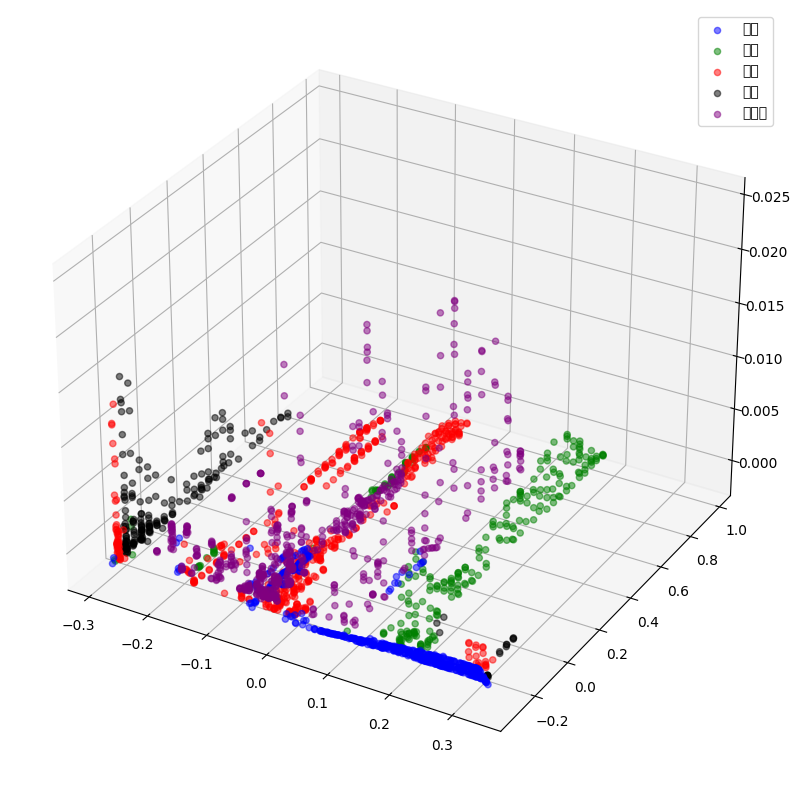

             x         y         z
1     0.288872 -0.315436 -0.001240
7     0.182867 -0.323874 -0.001119
9     0.286477 -0.315436 -0.001262
11   -0.047830 -0.247895 -0.001155
12   -0.044117 -0.095584 -0.001410
...        ...       ...       ...
2011 -0.046513 -0.247895 -0.001387
2012  0.216405 -0.323874 -0.000963
2031  0.249944 -0.323874 -0.000775
2036 -0.044716 -0.222539 -0.000014
2038  0.167894 -0.323874 -0.001113

[359 rows x 3 columns]
             x         y         z
5     0.193048 -0.078631 -0.000214
18    0.193647  0.819118  0.001932
21    0.193887  0.261636  0.001562
49    0.181669 -0.315436 -0.001552
52   -0.047591  0.561161 -0.001191
...        ...       ...       ...
2024  0.193048  0.304333  0.000679
2026 -0.047471  0.518271 -0.001327
2030  0.235690 -0.290117 -0.001648
2037  0.192689  0.690007 -0.000974
2046 -0.047351  0.647030 -0.001251

[295 rows x 3 columns]
             x         y         z
3    -0.152638  0.518271 -0.001395
15   -0.025791  0.475423 -0.001247
17   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

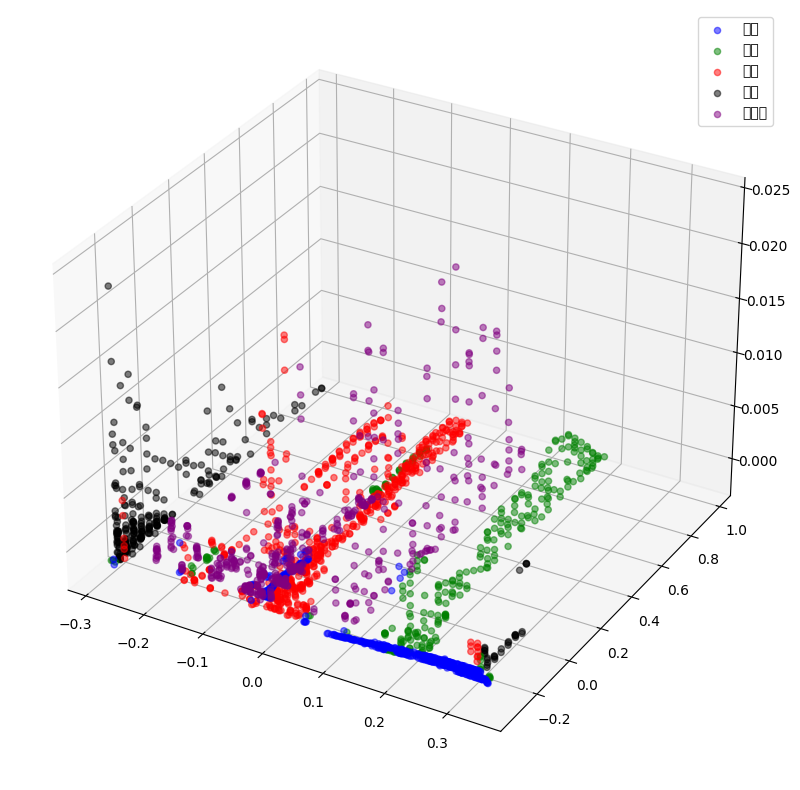

             x         y         z
6     0.210437 -0.281697 -0.001028
7     0.277722 -0.273454 -0.001367
9    -0.060459 -0.265211  0.000819
11   -0.061629 -0.033790 -0.001420
14    0.219214 -0.289940 -0.000348
...        ...       ...       ...
2031  0.086516  0.115583 -0.000342
2034  0.213948 -0.289940 -0.000386
2036  0.251393 -0.289940 -0.000234
2042 -0.062799  0.032545 -0.001263
2043  0.154854 -0.289940 -0.000737

[559 rows x 3 columns]
             x         y         z
5     0.172758 -0.174429  0.007760
8    -0.291569 -0.256962  0.000473
10    0.173460  0.700557  0.002373
20    0.173109  0.074046  0.001090
26    0.173343  0.407280  0.002026
...        ...       ...       ...
2022  0.172992  0.942573 -0.000387
2028  0.172641  0.532781  0.003497
2030  0.171938  0.449083 -0.001380
2037  0.133323 -0.256962 -0.001377
2039 -0.062799  0.574683 -0.000660

[311 rows x 3 columns]
             x         y         z
0    -0.165073  0.532781 -0.001350
1    -0.165073 -0.091749 -0.001438
2    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

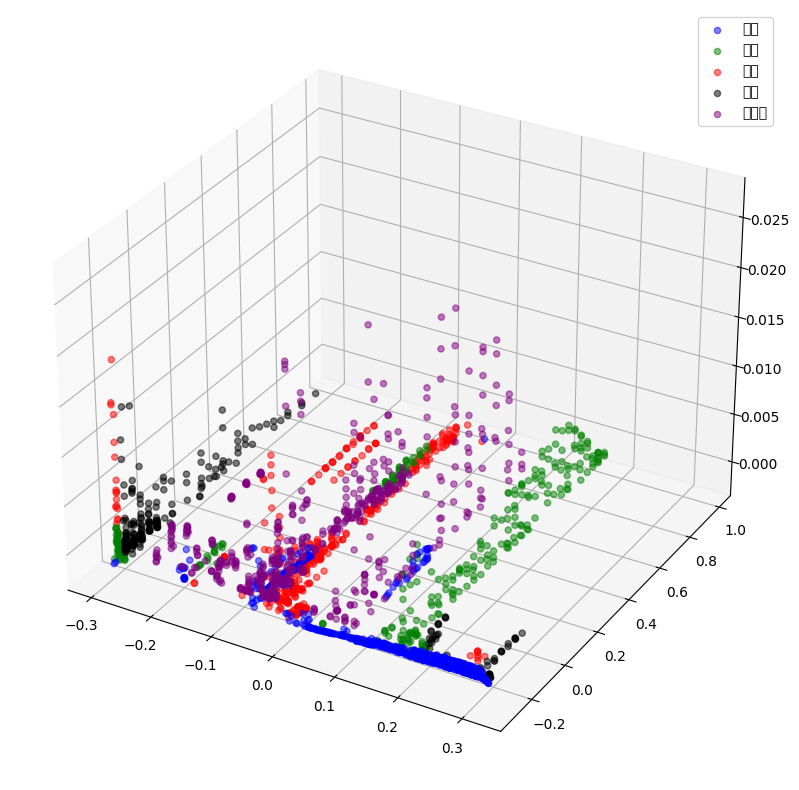

             x         y         z
2     0.128927 -0.308673 -0.001060
4    -0.178618 -0.292476  0.002463
11    0.128927 -0.300575 -0.001466
17    0.252519 -0.308673 -0.000418
21    0.289310 -0.308673 -0.000366
...        ...       ...       ...
2017  0.142148 -0.308673 -0.000860
2018  0.150196 -0.308673 -0.000777
2020  0.073741 -0.308673 -0.001367
2024 -0.057325 -0.300575 -0.001469
2046  0.157094 -0.308673 -0.000858

[455 rows x 3 columns]
             x         y         z
0     0.169741  0.582009  0.002940
1     0.168131 -0.276273 -0.000869
5     0.194460 -0.162707 -0.001390
12    0.170431  0.048943  0.001242
14   -0.285196 -0.276273  0.002817
...        ...       ...       ...
2033  0.170316  0.130597  0.001382
2037 -0.061349  0.705763 -0.000953
2041  0.170086  0.866367  0.000729
2042  0.170086  0.212382  0.003145
2043 -0.286920 -0.235746 -0.000369

[500 rows x 3 columns]
             x         y         z
3    -0.040309 -0.154588 -0.001264
6    -0.023639 -0.154588 -0.001449
9    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

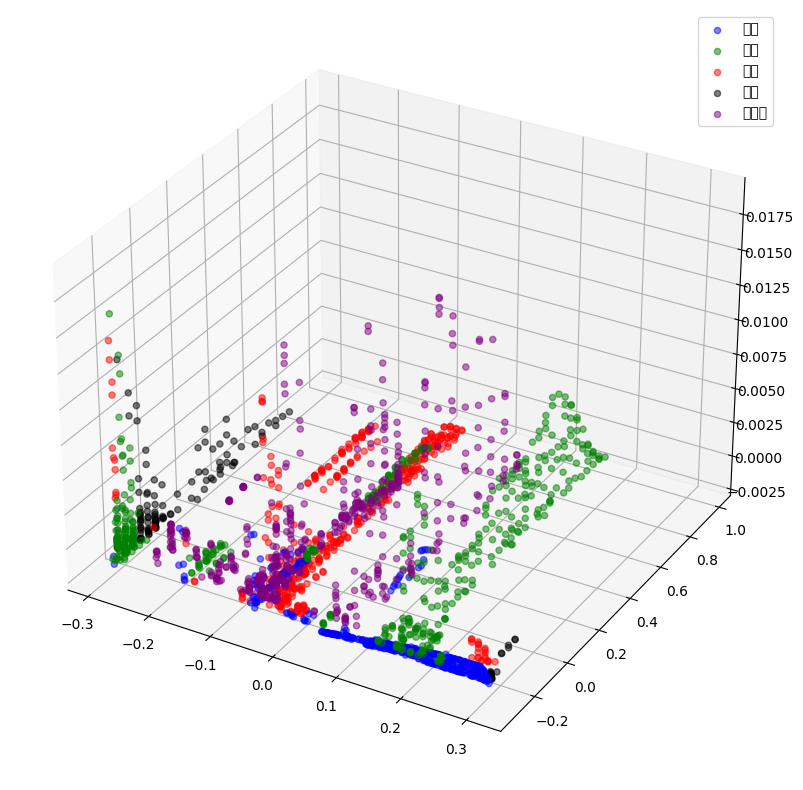

             x         y         z
7     0.248340 -0.304678 -0.001337
17    0.318466 -0.313051 -0.000668
19    0.223974 -0.313051 -0.000904
20    0.286375 -0.304678 -0.001263
31    0.175836 -0.304678 -0.001536
...        ...       ...       ...
2010  0.259631 -0.313051 -0.000761
2015  0.078965 -0.313051 -0.001664
2028 -0.048214 -0.271181 -0.001437
2035  0.154441 -0.304678 -0.001559
2040  0.289940 -0.296306 -0.001678

[356 rows x 3 columns]
             x         y         z
4     0.189861  0.981810 -0.001540
8    -0.281891 -0.195723 -0.000205
9    -0.050116 -0.111742 -0.001262
12    0.189742  0.352715  0.003380
22   -0.284030 -0.195723 -0.001251
...        ...       ...       ...
2021 -0.282129 -0.237656  0.000305
2025  0.327856 -0.279554 -0.001244
2031  0.186414 -0.195723 -0.001162
2032  0.200915 -0.069694 -0.001527
2033  0.200558 -0.111742 -0.001520

[488 rows x 3 columns]
             x         y         z
0    -0.027057  0.607760 -0.000705
10   -0.027176  0.437601 -0.000576
11   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

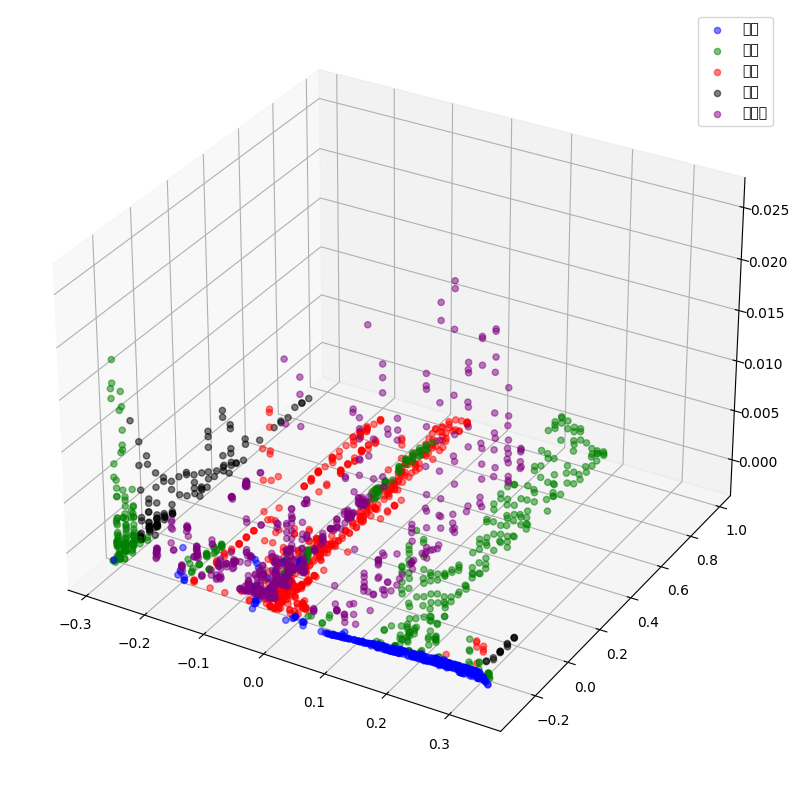

             x         y         z
5     0.170104 -0.319093 -0.000620
7     0.120440 -0.319093 -0.000952
11    0.209596 -0.302233 -0.001438
13    0.195235 -0.293803 -0.001407
25    0.274219 -0.310663 -0.000810
...        ...       ...       ...
2012  0.299350 -0.310663 -0.000840
2014 -0.064454 -0.200961 -0.000852
2027 -0.188554 -0.285366 -0.001211
2033  0.105481 -0.319093 -0.001075
2042  0.201219 -0.319093 -0.000434

[486 rows x 3 columns]
             x         y         z
9     0.173694  0.436697  0.001311
10    0.174652  0.095630  0.000053
16    0.174173  0.865931  0.001891
23    0.043610 -0.243182 -0.001268
30    0.174771  0.779846  0.001371
...        ...       ...       ...
2037  0.174293  0.265891  0.003648
2041 -0.077020  0.436697 -0.001466
2043 -0.066369  0.693875 -0.001056
2044 -0.303320 -0.243182 -0.000782
2047  0.174652 -0.243182  0.004238

[308 rows x 3 columns]
             x         y         z
0    -0.171561  0.650937 -0.000865
2    -0.050811 -0.031699  0.001889
3    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

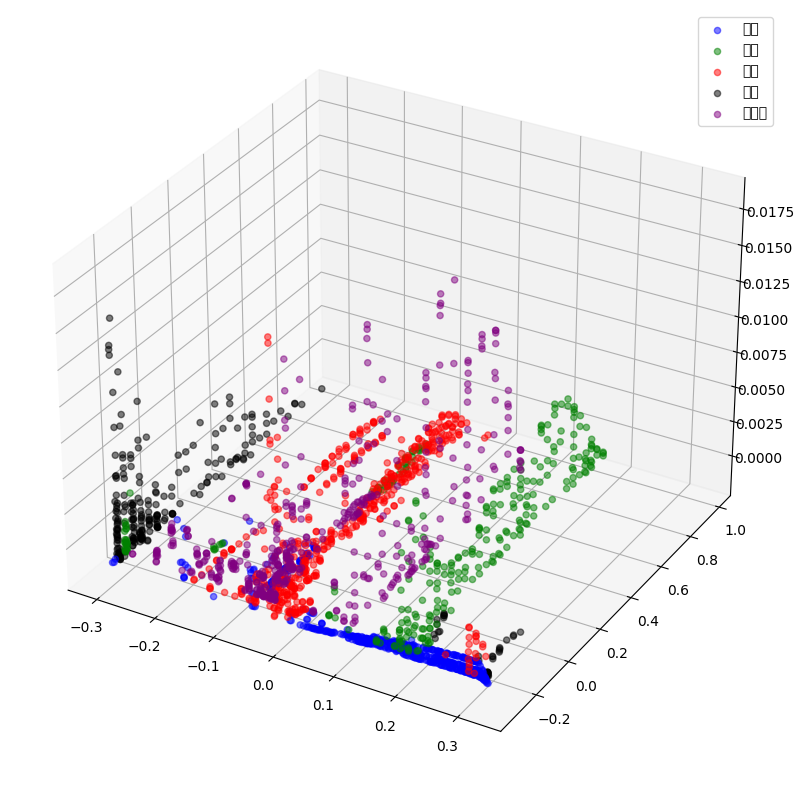

             x         y         z
1     0.166882 -0.316690 -0.000919
10    0.048713 -0.316690 -0.001612
15    0.085715 -0.316690 -0.001413
17    0.074376 -0.316690 -0.001475
18    0.253421 -0.308282 -0.001098
...        ...       ...       ...
2015  0.319667 -0.308282 -0.001393
2021  0.211644 -0.308282 -0.001198
2029  0.230742 -0.299874 -0.001588
2040  0.246856 -0.299874 -0.001544
2047  0.311312 -0.299874 -0.001527

[446 rows x 3 columns]
             x         y         z
0    -0.182255 -0.080745 -0.001345
2     0.139429 -0.198864 -0.001607
5     0.179893  0.266782  0.002444
45    0.179296  0.822322 -0.000439
67    0.179296 -0.114527 -0.000218
...        ...       ...       ...
2026  0.179774  0.983663 -0.001488
2027  0.210927 -0.283051 -0.000996
2039  0.179177  0.608027 -0.000317
2044  0.177744 -0.240976 -0.001355
2046 -0.059908  0.608027 -0.001476

[295 rows x 3 columns]
             x         y         z
7    -0.037945  0.012258 -0.000544
9    -0.165067  0.779409 -0.001583
14   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

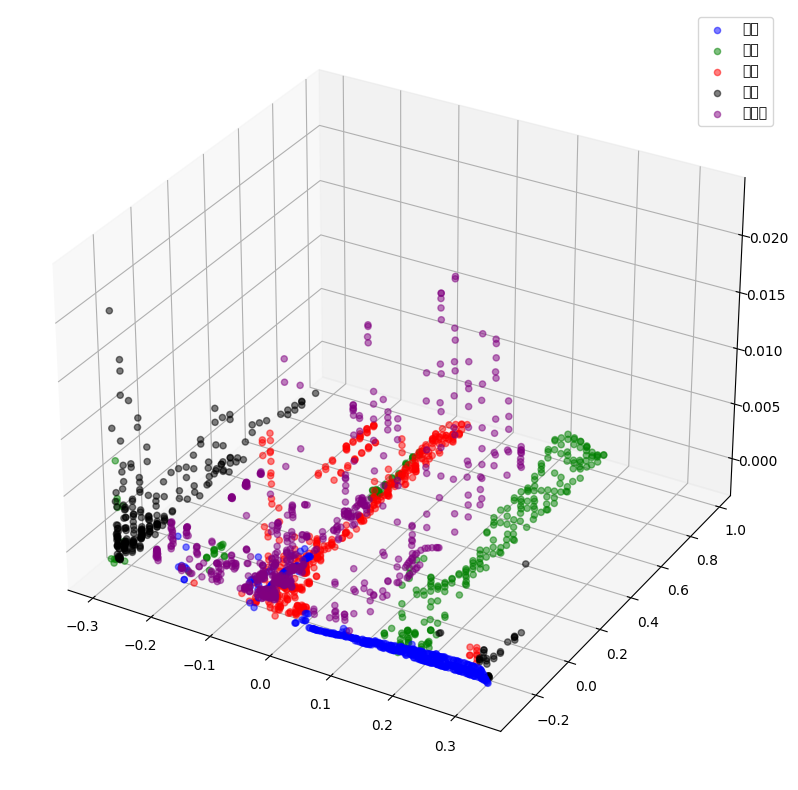

             x         y         z
8     0.261183 -0.297945 -0.001092
11    0.056146 -0.306294 -0.001586
23    0.213776 -0.306294 -0.000556
28    0.252887 -0.289597 -0.001566
32    0.198368 -0.306294 -0.000227
...        ...       ...       ...
2030  0.177035 -0.306294 -0.000849
2031  0.313924 -0.297945 -0.001524
2039 -0.064743 -0.046859 -0.001472
2040  0.262961 -0.297945 -0.001126
2043 -0.062373 -0.256189  0.001663

[464 rows x 3 columns]
             x         y         z
5     0.173598  0.905014 -0.000284
6     0.204887 -0.231115 -0.001263
15    0.173598  0.230844  0.001349
17    0.173005 -0.231115  0.002983
21    0.174072  0.399869 -0.000391
...        ...       ...       ...
2038 -0.299173 -0.272893  0.000719
2041  0.205005 -0.272893 -0.001245
2044  0.133538 -0.231115 -0.001617
2046  0.173242  0.782048  0.002546
2047 -0.297751 -0.272893  0.002752

[321 rows x 3 columns]
             x         y         z
0    -0.043528  0.526980 -0.001089
7    -0.043291 -0.147453  0.000115
9    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

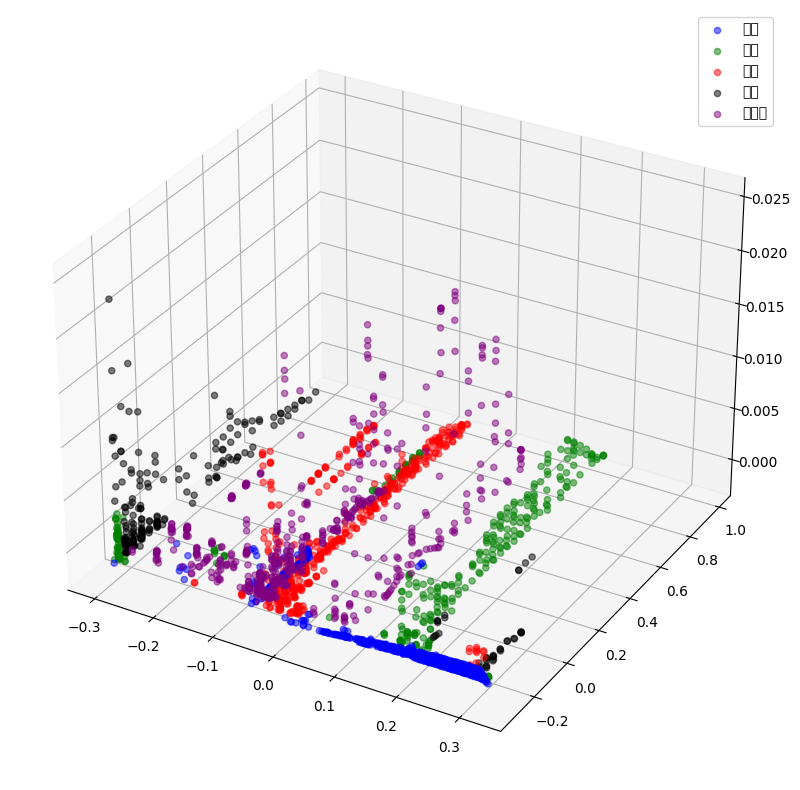

             x         y         z
2     0.083289 -0.284158 -0.000978
5     0.082699 -0.292473 -0.001550
6     0.297555 -0.300789 -0.000134
7     0.296965 -0.284158 -0.001388
8    -0.066048 -0.092494 -0.001216
...        ...       ...       ...
2034  0.247383 -0.284158 -0.001430
2036  0.070303 -0.300789 -0.001347
2038  0.139955 -0.300789 -0.000864
2039  0.132872 -0.292473 -0.001341
2041  0.175961 -0.300789 -0.000616

[583 rows x 3 columns]
             x         y         z
3    -0.298848 -0.225906  0.000459
10    0.170885  0.985290 -0.001420
12   -0.300265 -0.225906 -0.000435
14    0.130628 -0.184257 -0.001423
15    0.171121 -0.267519  0.002123
...        ...       ...       ...
2029  0.171003  0.066417 -0.000024
2030 -0.064277  0.588398 -0.001504
2040  0.169704 -0.225906 -0.000269
2044  0.130628 -0.225906 -0.001193
2047  0.170176  0.571483  0.002867

[309 rows x 3 columns]
             x         y         z
4    -0.045034 -0.184257  0.001369
16    0.278077 -0.267519 -0.000408
17   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

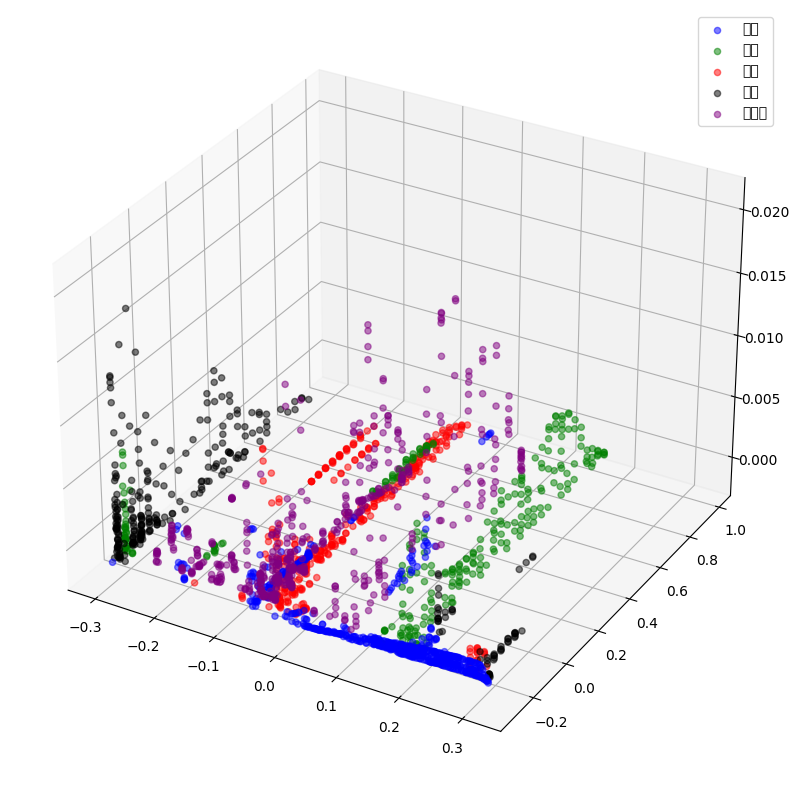

             x         y         z
2    -0.060764  0.011751 -0.001181
8     0.159090 -0.317356 -0.000674
12    0.027727 -0.317356 -0.001375
18    0.200887 -0.308944 -0.000870
23    0.147745 -0.308944 -0.001382
...        ...       ...       ...
2017  0.182974 -0.308944 -0.001196
2018  0.295827 -0.317356 -0.000285
2025  0.203873 -0.317356 -0.000534
2029 -0.060883 -0.199473 -0.001325
2044 -0.057659 -0.191047  0.000506

[463 rows x 3 columns]
             x         y         z
7     0.304306 -0.283701 -0.000729
13    0.318278 -0.283701 -0.000906
16    0.179391  0.650634  0.003412
19    0.180586  0.266397  0.000575
20   -0.293754 -0.283701  0.000071
...        ...       ...       ...
2024  0.180227  0.607807  0.005290
2031  0.180586 -0.241605  0.002258
2041  0.179153 -0.030567 -0.000779
2043  0.180227 -0.241605  0.006491
2046 -0.182454 -0.047484 -0.001460

[403 rows x 3 columns]
             x         y         z
0    -0.044642  0.308966 -0.000449
3    -0.038074  0.565023  0.000424
4    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

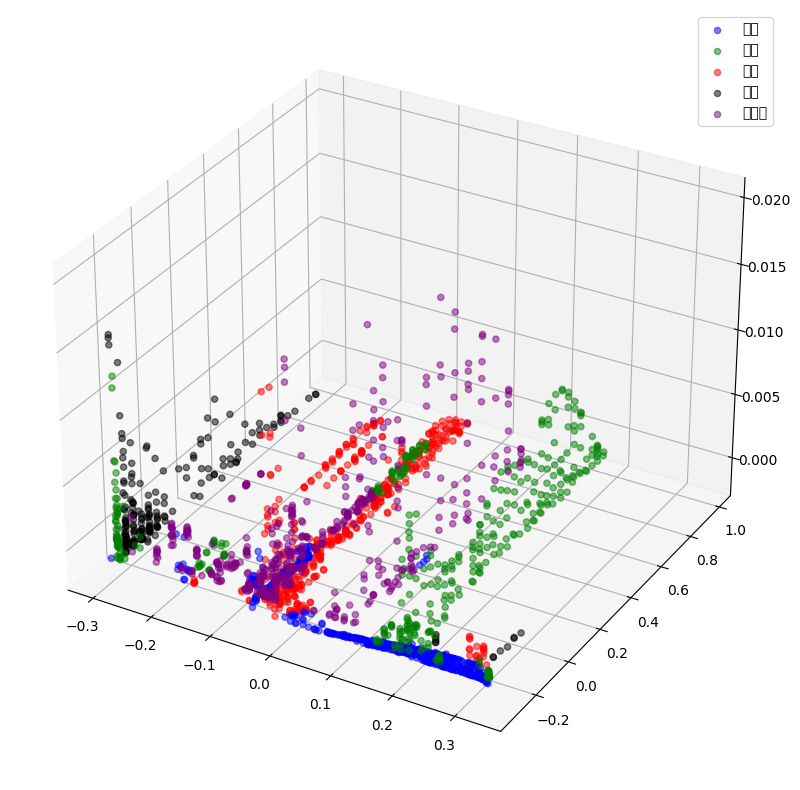

             x         y         z
3     0.275424 -0.289745 -0.001398
7     0.045673 -0.306429 -0.001443
8     0.143376 -0.298087 -0.001283
10    0.062845 -0.306429 -0.001463
15    0.237527 -0.306429 -0.000448
...        ...       ...       ...
2031  0.287267 -0.298087 -0.000946
2032  0.271871 -0.306429 -0.000338
2034  0.309176 -0.298087 -0.000972
2045 -0.056767 -0.181170 -0.000960
2046  0.284306 -0.298087 -0.000972

[471 rows x 3 columns]
             x         y         z
5     0.179379  0.611043  0.004225
11    0.179023  0.441501  0.001317
13   -0.179222 -0.063954 -0.001441
22    0.179615  0.738519  0.003365
26    0.179142  0.188155  0.000667
...        ...       ...       ...
2026  0.210880 -0.273053 -0.000789
2036  0.180089  0.314686 -0.000084
2038  0.179379  0.903953  0.000064
2042  0.179615  0.314686  0.002495
2044  0.179497 -0.231307  0.005121

[325 rows x 3 columns]
             x         y         z
0    -0.041608  0.441501 -0.000990
1    -0.043503  0.526208 -0.000959
2    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

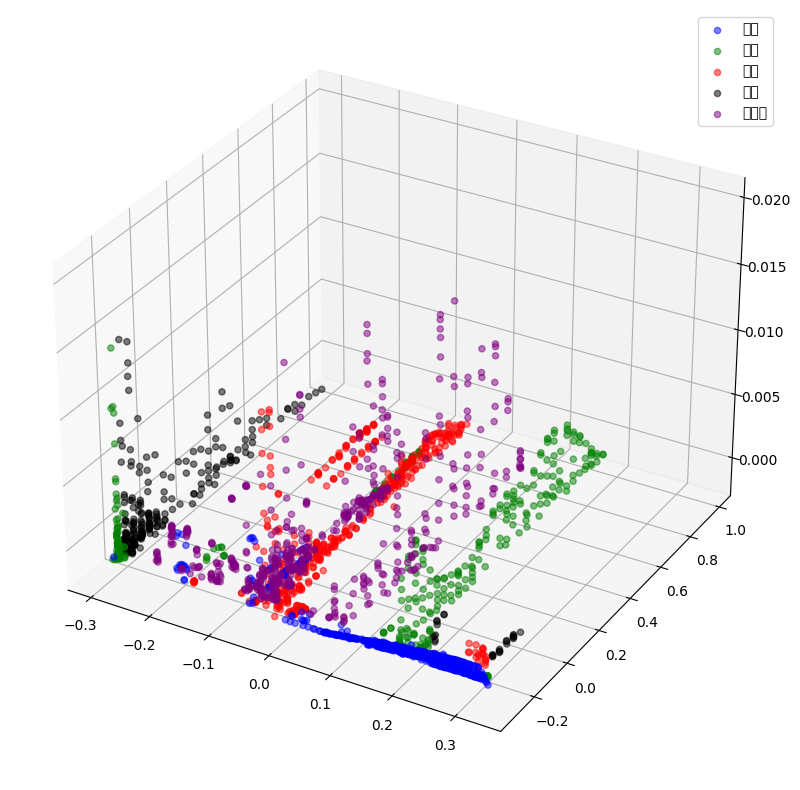

             x         y         z
3     0.092530 -0.311696 -0.001422
5     0.309007 -0.303318 -0.001071
7     0.090151  0.125850 -0.001560
8    -0.059718 -0.017625 -0.001468
9    -0.059718 -0.101830 -0.001117
...        ...       ...       ...
2019  0.220989 -0.311696 -0.000579
2034  0.316144 -0.303318 -0.001371
2039 -0.183420 -0.253026  0.000478
2042 -0.184014 -0.253026 -0.001120
2047  0.238235 -0.294939 -0.001562

[491 rows x 3 columns]
             x         y         z
15    0.177931  0.142756 -0.000356
17    0.178169  0.354543  0.000023
26    0.177693  0.269724  0.002602
32    0.176623  0.227368 -0.001428
34    0.174601 -0.236248 -0.000413
...        ...       ...       ...
2005  0.177693  0.524565  0.002957
2020 -0.183420 -0.076580 -0.001384
2024  0.177217 -0.194285  0.005537
2025 -0.062335  0.652425 -0.001203
2029  0.178407  0.185041 -0.001644

[283 rows x 3 columns]
             x         y         z
6    -0.026771 -0.278176 -0.001349
10   -0.044018  0.439490 -0.001644
12   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

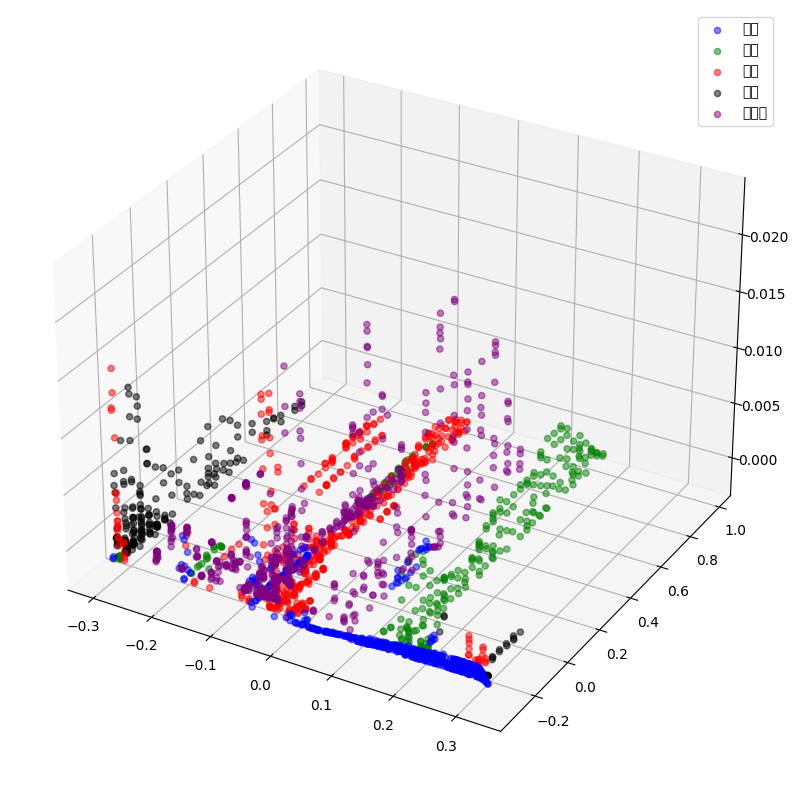

             x         y         z
3     0.206609 -0.326075 -0.000932
6    -0.049728 -0.266853  0.000742
8     0.298459 -0.309161 -0.001562
15    0.201207 -0.326075 -0.000941
16    0.285252 -0.326075 -0.000610
...        ...       ...       ...
2019  0.240828 -0.326075 -0.000766
2020  0.244430 -0.326075 -0.000723
2025  0.094950 -0.326075 -0.001502
2033  0.178394 -0.326075 -0.001068
2035  0.211412 -0.317618 -0.001373

[388 rows x 3 columns]
             x         y         z
7    -0.289736 -0.207558 -0.001539
9     0.188240  0.561058 -0.000887
11    0.189800  0.346441  0.000109
12   -0.289016 -0.292239  0.000147
17    0.188840 -0.080251  0.001235
...        ...       ...       ...
2030 -0.288776 -0.249916 -0.000964
2032 -0.290577 -0.292239  0.001406
2042  0.313227 -0.292239 -0.001028
2044 -0.288416 -0.292239 -0.001385
2046 -0.287335 -0.292239  0.000165

[431 rows x 3 columns]
             x         y         z
5    -0.036040  0.518065 -0.001202
10   -0.024034 -0.249916 -0.001266
13   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

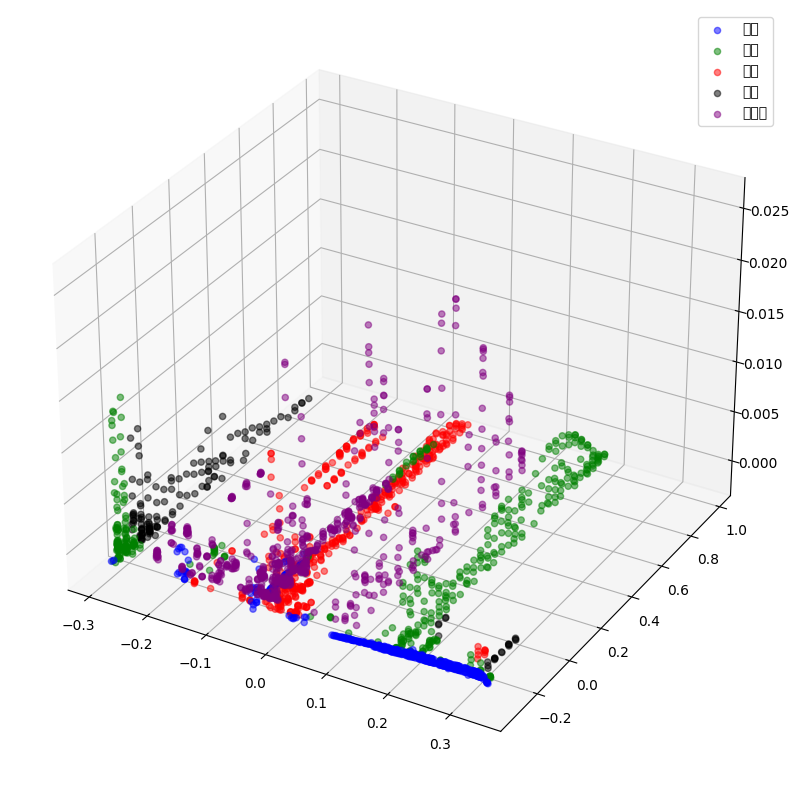

             x         y         z
5    -0.056589 -0.162803 -0.001352
10   -0.067299 -0.053364 -0.001229
12   -0.067299 -0.036506 -0.001533
20    0.251634 -0.322296 -0.000018
22    0.120133 -0.313913 -0.001383
...        ...       ...       ...
2023 -0.051472  0.217046 -0.001337
2034  0.208792 -0.322296 -0.000165
2036 -0.066347  0.005665 -0.001260
2042  0.264724 -0.322296  0.000040
2044 -0.052424 -0.120740  0.000165

[572 rows x 3 columns]
             x         y         z
9     0.170949  0.471826 -0.000887
13    0.171663  0.514397  0.004505
14   -0.171786 -0.120740 -0.001235
21    0.203437 -0.288758 -0.000320
23    0.171068  0.599645  0.000522
...        ...       ...       ...
2029  0.172615  0.429277 -0.000277
2031  0.172496  0.090113 -0.000757
2035  0.161190 -0.288758 -0.001540
2037  0.066462 -0.246809 -0.001049
2046  0.171901 -0.246809  0.007916

[349 rows x 3 columns]
             x         y         z
0     0.294952 -0.246809 -0.001117
2    -0.051115  0.005665 -0.001380
4    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

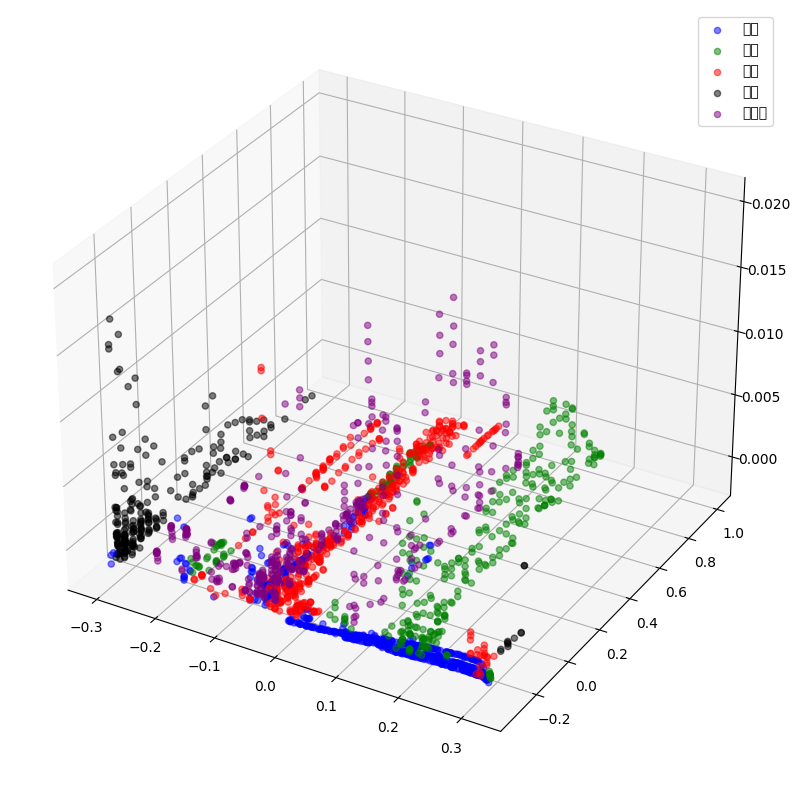

             x         y         z
5     0.284406 -0.282266 -0.001295
7    -0.071263 -0.082398 -0.001176
11    0.186494 -0.298885 -0.000185
15    0.124561 -0.298885 -0.000461
16   -0.070673 -0.132447 -0.001492
...        ...       ...       ...
2026  0.104507 -0.290576 -0.001393
2027 -0.071145  0.277758 -0.001345
2036  0.049653 -0.298885 -0.001354
2039 -0.068904 -0.007230 -0.001174
2045  0.118073 -0.298885 -0.000898

[597 rows x 3 columns]
             x         y         z
8     0.165142 -0.140784  0.005036
9     0.165731  0.151833 -0.000755
14    0.166085  0.657314 -0.000812
23    0.176702 -0.099088 -0.001309
24    0.206784 -0.265640 -0.001513
...        ...       ...       ...
2013 -0.069493  0.403986 -0.001154
2017  0.165142  0.403986  0.002767
2030  0.165378  0.657314  0.004172
2033  0.165496  0.699641  0.003319
2041  0.164316  0.193770 -0.001511

[401 rows x 3 columns]
             x         y         z
21    0.272727 -0.265640 -0.000612
28   -0.051445 -0.140784 -0.001089
36   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

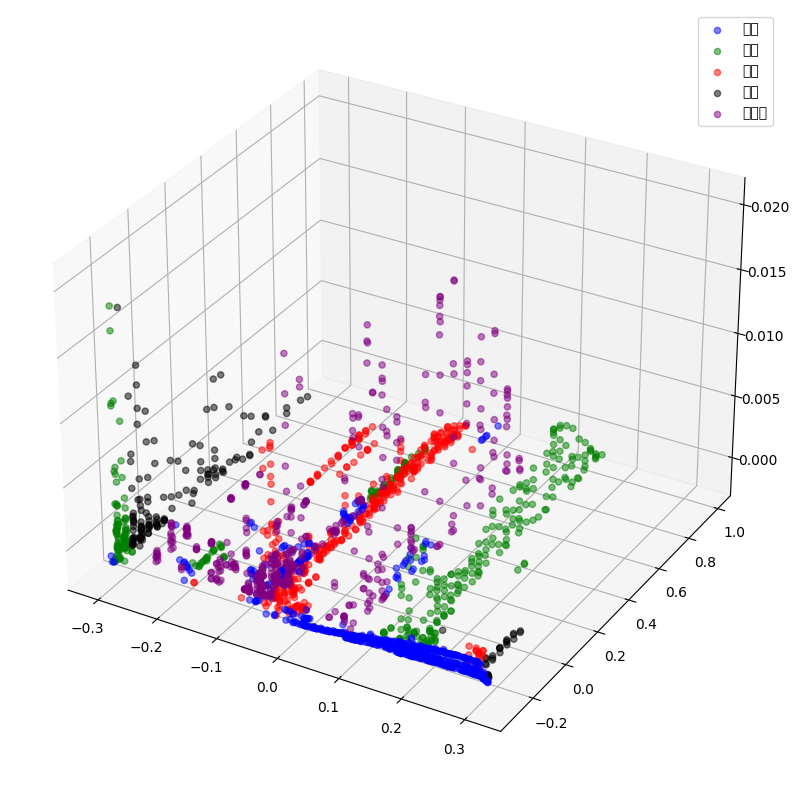

             x         y         z
0    -0.003438  0.876473 -0.001395
2     0.182189 -0.278797 -0.001282
4     0.276764 -0.295348  0.000047
8     0.261491 -0.295348 -0.000007
11    0.047668 -0.295348 -0.001345
...        ...       ...       ...
2031  0.163979 -0.287073 -0.001098
2038  0.188650 -0.278797 -0.001399
2040 -0.058656 -0.204253  0.000887
2041 -0.058656 -0.088055  0.000867
2043  0.289688 -0.278797 -0.001240

[570 rows x 3 columns]
             x         y         z
1    -0.292686 -0.220825 -0.001421
3     0.174552 -0.179377  0.003198
5     0.174082  0.614818 -0.001185
21    0.172555 -0.220825 -0.000270
23   -0.061475  0.572727 -0.000842
...        ...       ...       ...
2013  0.175140  0.195297  0.001501
2018  0.174552 -0.262239  0.002246
2030 -0.061710  0.656950 -0.000825
2035  0.175375  0.404656  0.002271
2046  0.175727  0.320821  0.000224

[298 rows x 3 columns]
             x         y         z
7    -0.039623 -0.054805  0.000205
10   -0.045732  0.741278  0.000536
18   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

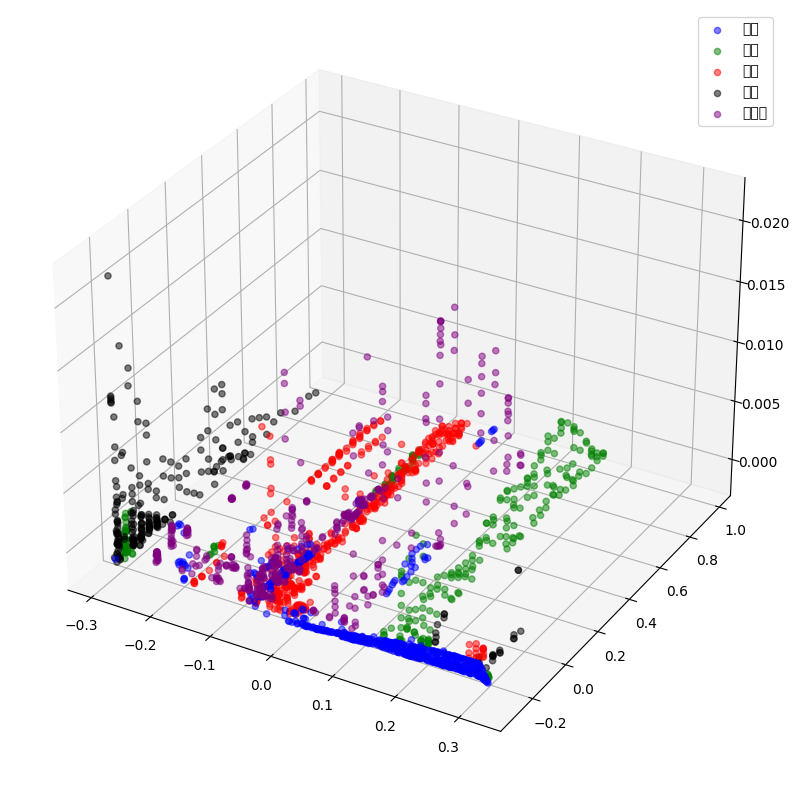

             x         y         z
7    -0.059675 -0.295085 -0.001272
10    0.316354 -0.329029 -0.000547
12    0.204943 -0.320545 -0.001366
16   -0.058832 -0.133547 -0.001347
19    0.292868 -0.329029 -0.000519
...        ...       ...       ...
2027  0.241076 -0.329029 -0.000628
2033  0.271790 -0.329029 -0.000567
2037  0.188683 -0.320545 -0.001403
2038  0.161583 -0.320545 -0.001385
2042  0.095338 -0.329029 -0.001497

[439 rows x 3 columns]
             x         y         z
2    -0.059313  0.474702 -0.001667
4    -0.182890 -0.159093 -0.001623
5    -0.059916  0.647261 -0.000682
6     0.171218 -0.295085 -0.001495
11    0.059927 -0.252628 -0.000522
...        ...       ...       ...
2032  0.183263  0.939581 -0.001654
2034 -0.295747 -0.295085  0.006128
2035  0.182420  0.690477  0.005847
2036 -0.164823 -0.167606 -0.001638
2044  0.183263  0.777002  0.000436

[463 rows x 3 columns]
             x         y         z
1    -0.036670  0.647261 -0.001385
8    -0.043415  0.002900 -0.000645
9    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

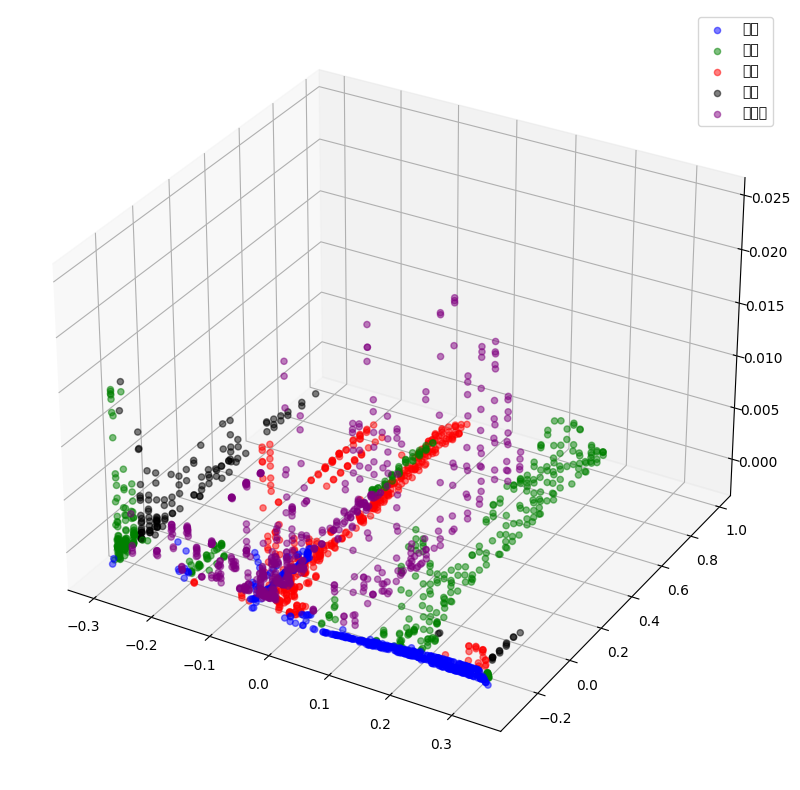

             x         y         z
0     0.185380 -0.297224 -0.001567
1     0.298363 -0.297224 -0.001300
7     0.270561 -0.305557 -0.000726
31    0.002005 -0.297224 -0.001398
33    0.249266 -0.297224 -0.001349
...        ...       ...       ...
2031 -0.053599 -0.130276  0.000210
2039  0.313743 -0.297224 -0.001356
2043  0.254590 -0.297224 -0.001360
2044  0.238618 -0.288890 -0.001759
2045  0.298955 -0.297224 -0.001299

[399 rows x 3 columns]
             x         y         z
2     0.180885 -0.105184 -0.001128
3    -0.288556 -0.272216 -0.000662
15   -0.177229 -0.147000 -0.001763
17   -0.289029 -0.272216 -0.000207
19    0.181003  0.441606 -0.000437
...        ...       ...       ...
1987 -0.056202  0.695849 -0.001075
2004  0.141252 -0.272216 -0.001663
2015  0.181950  0.568589  0.004852
2040  0.182659  0.188520 -0.001597
2042  0.181831  0.526226  0.004319

[355 rows x 3 columns]
             x         y         z
5    -0.021065 -0.272216 -0.000841
10   -0.040467 -0.230513  0.009896
13   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

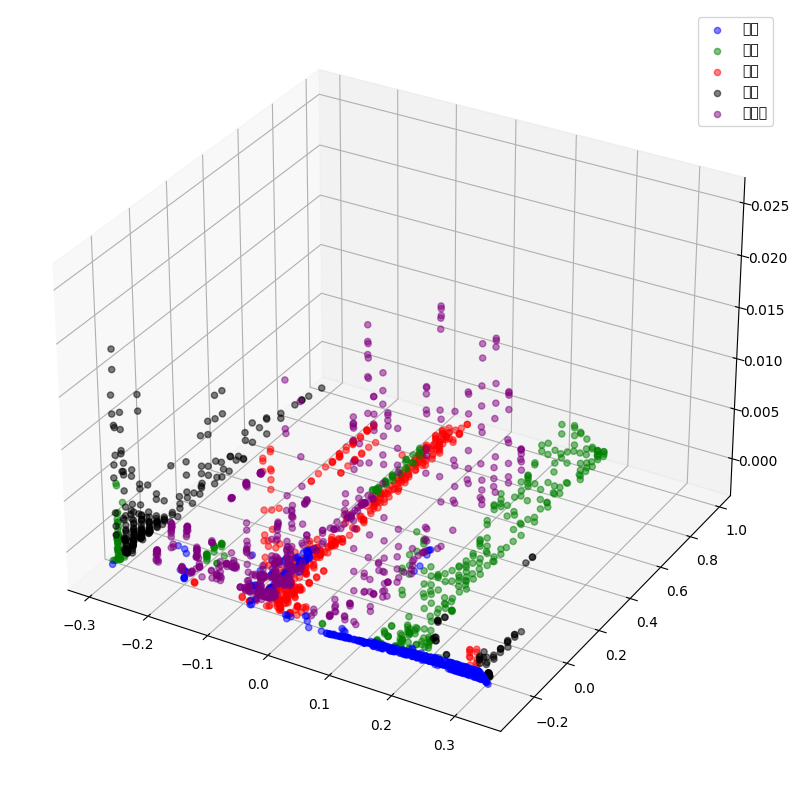

             x         y         z
0     0.250755 -0.317181 -0.000332
1     0.264487 -0.308770 -0.000993
9     0.301506 -0.300358 -0.001437
17    0.192242 -0.317181 -0.000651
25   -0.057332  0.292072 -0.001523
...        ...       ...       ...
2010  0.309865 -0.308770 -0.000950
2015  0.100294 -0.317181 -0.001160
2018  0.280011 -0.308770 -0.000925
2020 -0.182717 -0.283528  0.002419
2041  0.072829 -0.317181 -0.001425

[535 rows x 3 columns]
             x         y         z
3     0.179107  0.351690  0.001749
11    0.317507 -0.283528 -0.001145
12    0.178748  0.011906 -0.001503
13    0.210751 -0.241435 -0.000568
16    0.179107  0.607925  0.002728
...        ...       ...       ...
2022  0.179823  0.822311  0.003019
2030  0.177315 -0.241435 -0.000608
2032  0.180659 -0.114933 -0.001447
2033 -0.057929  0.599364 -0.001546
2044  0.179465  0.139067  0.001131

[375 rows x 3 columns]
             x         y         z
5    -0.045152 -0.283528  0.010968
7    -0.044197  0.822311 -0.001206
20   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

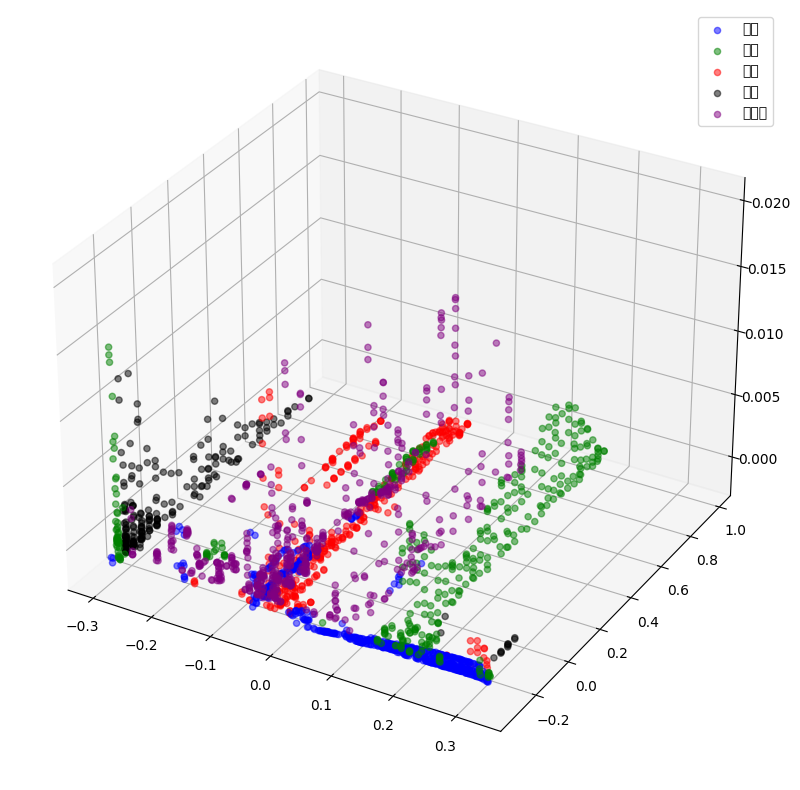

             x         y         z
1     0.177112 -0.300988 -0.001397
4    -0.048155 -0.267576 -0.000021
20    0.139172 -0.309340 -0.001162
21    0.100047  0.118377 -0.001521
22    0.015868 -0.292637 -0.001268
...        ...       ...       ...
2013  0.212680 -0.292637 -0.001209
2014  0.054401 -0.309340 -0.001595
2018 -0.051119 -0.309340  0.000697
2024  0.299823 -0.309340 -0.000379
2037 -0.050526 -0.292637  0.000144

[422 rows x 3 columns]
             x         y         z
6    -0.285396 -0.234134 -0.001532
7    -0.051356  0.481823 -0.001370
8     0.186597 -0.234134  0.002312
15   -0.155335 -0.192306 -0.001580
26   -0.055269  0.439432 -0.001400
...        ...       ...       ...
2004  0.099454 -0.275927 -0.001453
2016  0.187545  0.524234  0.001312
2019 -0.285752 -0.234134  0.000071
2021  0.186241  0.566689 -0.001029
2028  0.188019 -0.192306 -0.000600

[386 rows x 3 columns]
             x         y         z
0    -0.035825  0.312474 -0.000517
3    -0.029897 -0.234134  0.000123
9    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

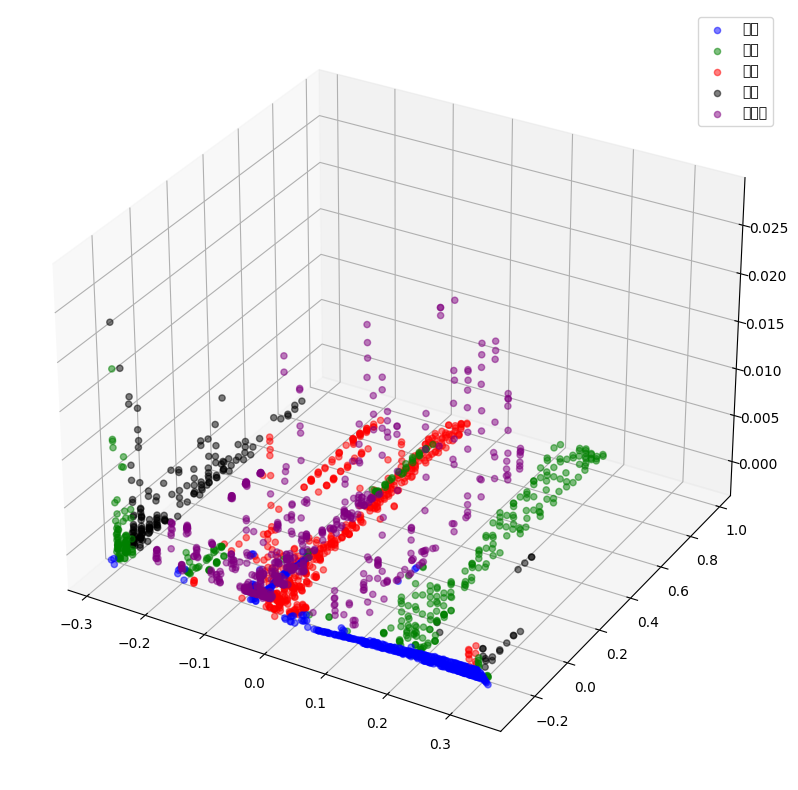

             x         y         z
4     0.036431 -0.300907 -0.001511
5     0.047050 -0.300907 -0.001476
14    0.268876 -0.284284 -0.001360
17    0.234894 -0.267654 -0.001513
18    0.088347  0.133141 -0.001364
...        ...       ...       ...
2017  0.112536 -0.292595 -0.001496
2018  0.241738 -0.300907 -0.000246
2033  0.257077 -0.284284 -0.001381
2035  0.087757  0.175073 -0.000257
2043  0.282445 -0.284284 -0.001357

[519 rows x 3 columns]
             x         y         z
2     0.174718  0.024264  0.001202
6     0.175190  0.275864  0.003902
8    -0.183035 -0.126091 -0.001360
13    0.175190  0.191858  0.001965
23    0.140736 -0.226062 -0.001447
...        ...       ...       ...
1999  0.174246 -0.017548 -0.000906
2002  0.134954 -0.267654 -0.001234
2027 -0.063155  0.402121 -0.001442
2028 -0.062565  0.740198 -0.000872
2031  0.175426  0.941873 -0.000825

[316 rows x 3 columns]
             x         y         z
1    -0.046990  0.905024 -0.001091
11   -0.165454  0.444273 -0.001296
29   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

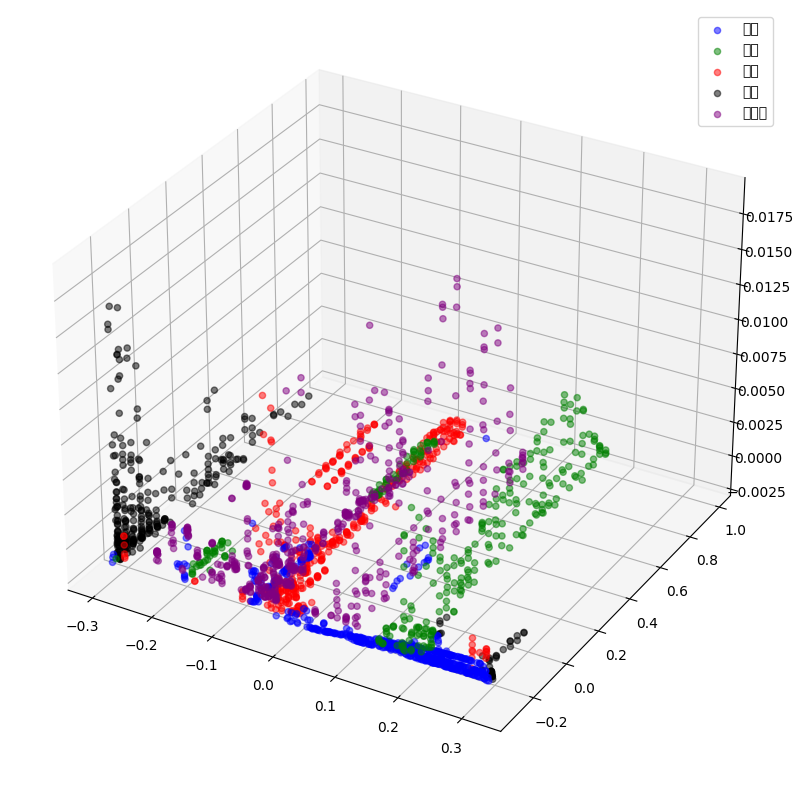

             x         y         z
0     0.184895 -0.296412 -0.001028
1     0.185487 -0.304748 -0.000438
16    0.113886 -0.304748 -0.001011
18    0.320996 -0.304748 -0.001253
19   -0.060087 -0.104303  0.000898
...        ...       ...       ...
2032  0.227501 -0.296412 -0.000866
2036  0.170101 -0.296412 -0.001179
2040 -0.061744  0.021405 -0.001112
2045  0.207973 -0.296412 -0.000994
2047  0.071280 -0.304748 -0.001295

[479 rows x 3 columns]
             x         y         z
3     0.174835  0.484997  0.001030
4     0.174362  0.442682 -0.001447
13    0.175664  0.231621  0.001791
14    0.175309  0.315952  0.003788
22   -0.165891 -0.146134 -0.001465
...        ...       ...       ...
2010  0.175545  0.654553  0.005048
2019  0.056013 -0.229677 -0.000704
2028  0.176255 -0.062436 -0.001314
2033  0.175309  0.824585  0.002838
2039  0.175427  0.904825  0.000468

[347 rows x 3 columns]
             x         y         z
2    -0.063046  0.782036 -0.001395
5    -0.026713 -0.229677 -0.000364
6    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

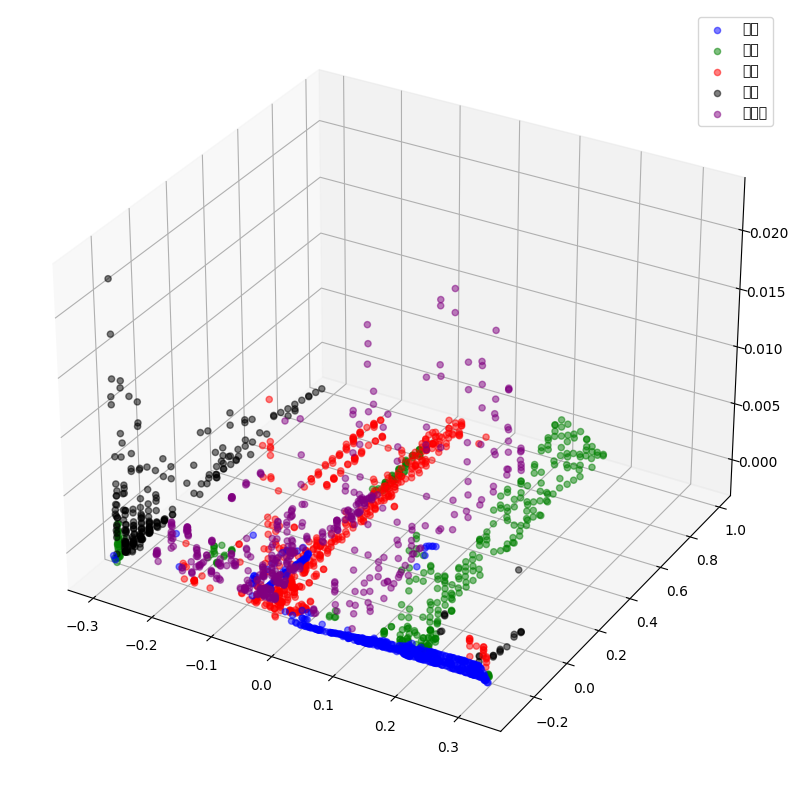

             x         y         z
0     0.269794 -0.314955 -0.000964
7    -0.059527  0.007217 -0.001210
9     0.151622 -0.314955 -0.001273
12   -0.060726 -0.298054  0.000385
21    0.068842 -0.323406 -0.001371
...        ...       ...       ...
2026  0.135426 -0.323406 -0.000994
2027  0.273393 -0.306504 -0.001392
2034  0.251198 -0.314955 -0.001003
2037 -0.060126 -0.272687 -0.000653
2044  0.177416 -0.314955 -0.001110

[477 rows x 3 columns]
             x         y         z
1    -0.295629 -0.289596  0.000071
2    -0.061806  0.606019 -0.001413
3     0.180895  0.220315 -0.000004
4     0.179456 -0.120213 -0.001182
5     0.181135  0.348588 -0.000708
...        ...       ...       ...
2023  0.181255 -0.289596 -0.000680
2028 -0.296709 -0.289596 -0.001445
2030  0.180295  0.177622  0.001046
2033 -0.061566  0.649043 -0.001112
2038  0.180775  0.391410  0.001053

[295 rows x 3 columns]
             x         y         z
10   -0.043330  0.348588 -0.001069
16   -0.038172  0.391410 -0.001141
17   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

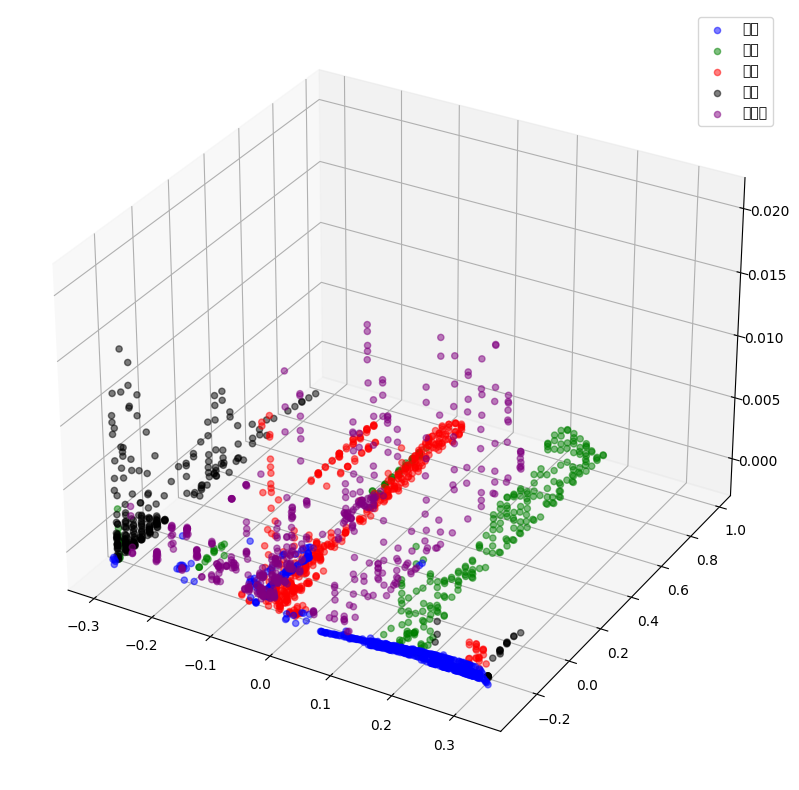

             x         y         z
3    -0.051742 -0.296419 -0.001489
10   -0.053560 -0.047979 -0.001693
25   -0.052954 -0.330585  0.000132
29    0.228917 -0.339125 -0.000958
31   -0.053197 -0.133792 -0.001672
...        ...       ...       ...
2009 -0.049923 -0.245122 -0.001312
2010  0.207701 -0.330585 -0.001549
2014  0.291353 -0.339125 -0.000744
2027  0.107076 -0.339125 -0.001598
2032 -0.049923 -0.270778 -0.001099

[392 rows x 3 columns]
             x         y         z
0     0.190243  0.124082 -0.000452
15    0.191092 -0.219452  0.003186
30    0.191092  0.937806 -0.001446
48    0.189879 -0.176644 -0.000230
52    0.190001 -0.262223  0.000956
...        ...       ...       ...
2030 -0.290090 -0.304959  0.011785
2031  0.190849  0.469878  0.001864
2036 -0.293727 -0.304959  0.001049
2039  0.189879  0.513246 -0.000827
2041  0.190971 -0.090904  0.000519

[355 rows x 3 columns]
             x         y         z
1    -0.159398  0.774161 -0.001406
4    -0.022039 -0.262223 -0.001697
5    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

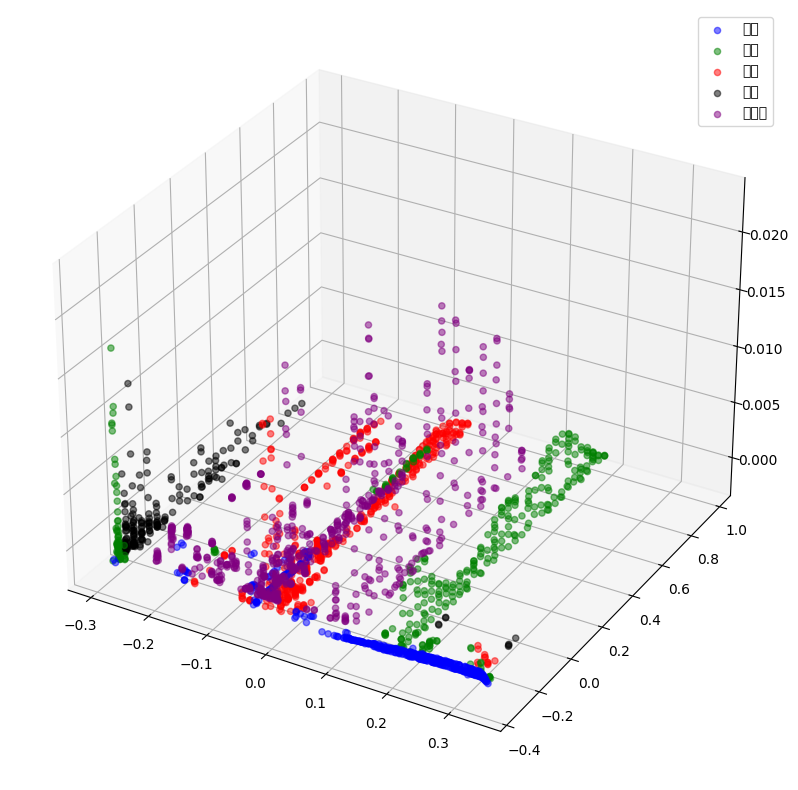

             x         y         z
10    0.153604 -0.278535 -0.001233
18    0.026292 -0.286506 -0.001506
21   -0.066504 -0.134839 -0.000845
24    0.198871 -0.270564 -0.001478
28    0.260546 -0.278535 -0.000928
...        ...       ...       ...
2037 -0.067749  0.025364 -0.001374
2039  0.169448 -0.286506 -0.000621
2042  0.261112 -0.286506 -0.000254
2044  0.213017 -0.270564 -0.001441
2047  0.162092 -0.286506 -0.000688

[561 rows x 3 columns]
             x         y         z
0     0.159715  0.870099 -0.000585
5     0.158697  0.509137  0.001661
8     0.159376  0.630786  0.005741
11   -0.068541  0.752687 -0.001349
16    0.188686 -0.214723 -0.000541
...        ...       ...       ...
2008 -0.167222 -0.094839 -0.001467
2012  0.160168  0.347372 -0.001315
2016  0.160055  0.186103 -0.001339
2038  0.159489  0.870099  0.000164
2040  0.169674 -0.094839 -0.001354

[394 rows x 3 columns]
             x         y         z
2    -0.012750 -0.198759 -0.001465
3    -0.290574 -0.214723  0.006037
9    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

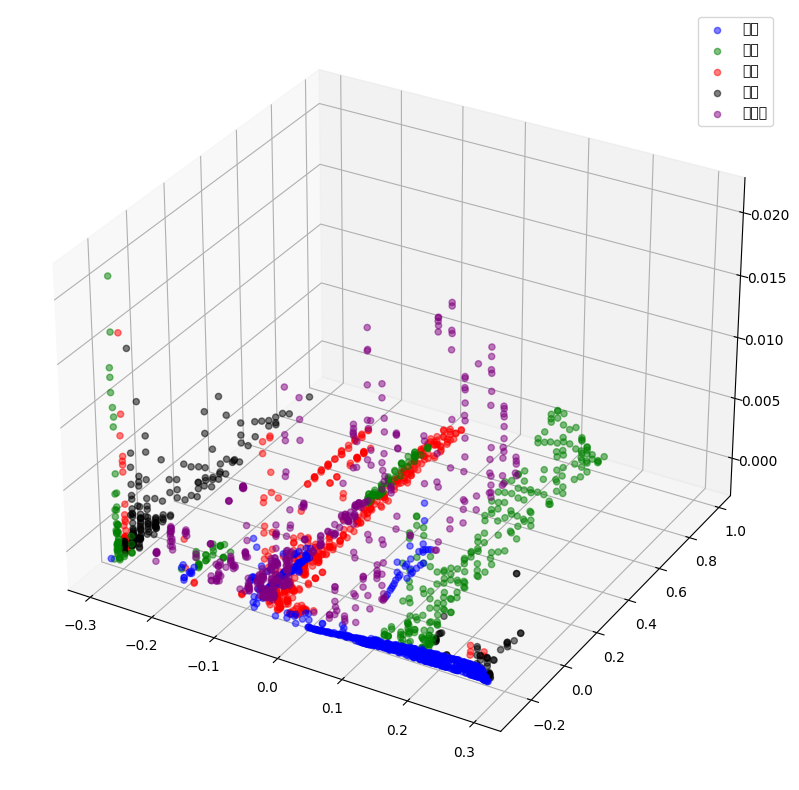

             x         y         z
7     0.169847 -0.302993 -0.000738
10   -0.063232  0.022733 -0.001453
18    0.087702 -0.286342 -0.001533
21   -0.062996 -0.186322 -0.001042
28    0.225989 -0.286342 -0.001456
...        ...       ...       ...
2034  0.214169 -0.302993 -0.000234
2037  0.258492 -0.302993 -0.000276
2038  0.137934 -0.302993 -0.000897
2045 -0.005671 -0.294668 -0.001447
2047  0.198213 -0.294668 -0.001123

[488 rows x 3 columns]
             x         y         z
0     0.313098 -0.269684 -0.001510
4    -0.062996  0.570321 -0.001315
12   -0.063941  0.655052 -0.001192
13    0.175520  0.485718 -0.001528
17    0.174220  0.739890  0.003897
...        ...       ...       ...
2010  0.174693  0.984622 -0.001270
2019  0.045507 -0.228021 -0.001409
2024 -0.060632  0.553386 -0.001473
2040  0.163346 -0.228021 -0.001523
2044  0.175284  0.655052  0.000070

[300 rows x 3 columns]
             x         y         z
1    -0.061814 -0.253026 -0.001283
2    -0.087462 -0.269684 -0.001496
9    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

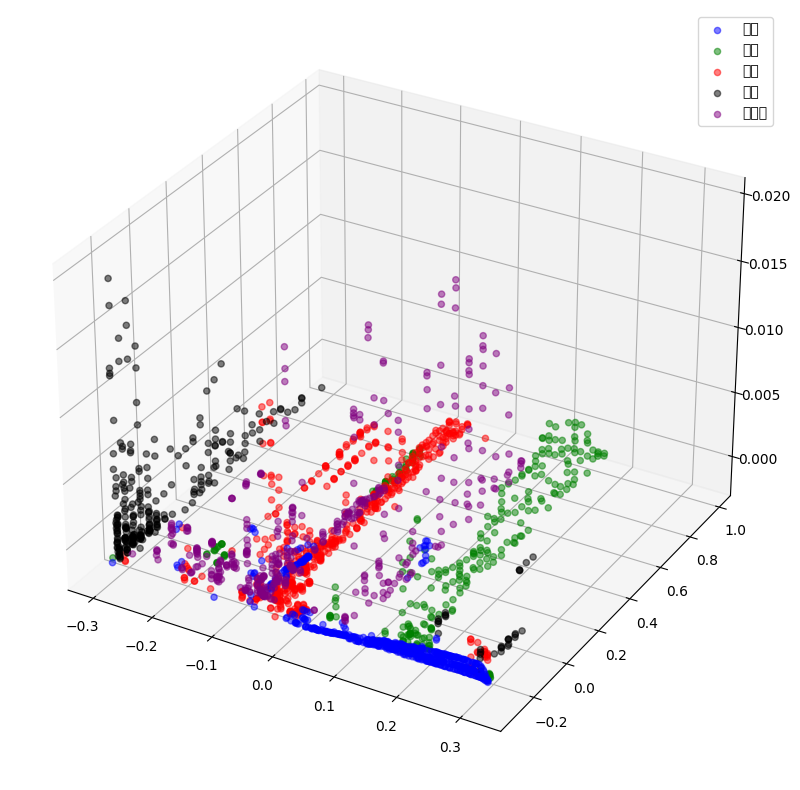

             x         y         z
4     0.006076 -0.285772 -0.001127
16    0.279494 -0.294091 -0.000911
22   -0.058292  0.392866 -0.001189
23   -0.057702 -0.060594 -0.001227
28    0.311973 -0.285772 -0.001605
...        ...       ...       ...
2013  0.093475 -0.302411 -0.001115
2017  0.222802 -0.294091 -0.001028
2029  0.151348 -0.302411 -0.000716
2034  0.163158 -0.294091 -0.001245
2046 -0.057111 -0.302411 -0.001338

[502 rows x 3 columns]
             x         y         z
6     0.136112 -0.227493 -0.001644
19    0.176386 -0.060594  0.001212
25    0.136584 -0.185825 -0.001533
29   -0.058292  0.604105 -0.001571
30    0.176741  0.190832  0.001429
...        ...       ...       ...
2022 -0.060654  0.612574 -0.001371
2023 -0.060654  0.485720 -0.001607
2032  0.176504  0.782152  0.003468
2039  0.176150 -0.227493  0.002730
2040  0.176150  0.527969  0.001094

[285 rows x 3 columns]
             x         y         z
1    -0.039513  0.274920 -0.001586
2    -0.038923  0.527969  0.000427
3    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

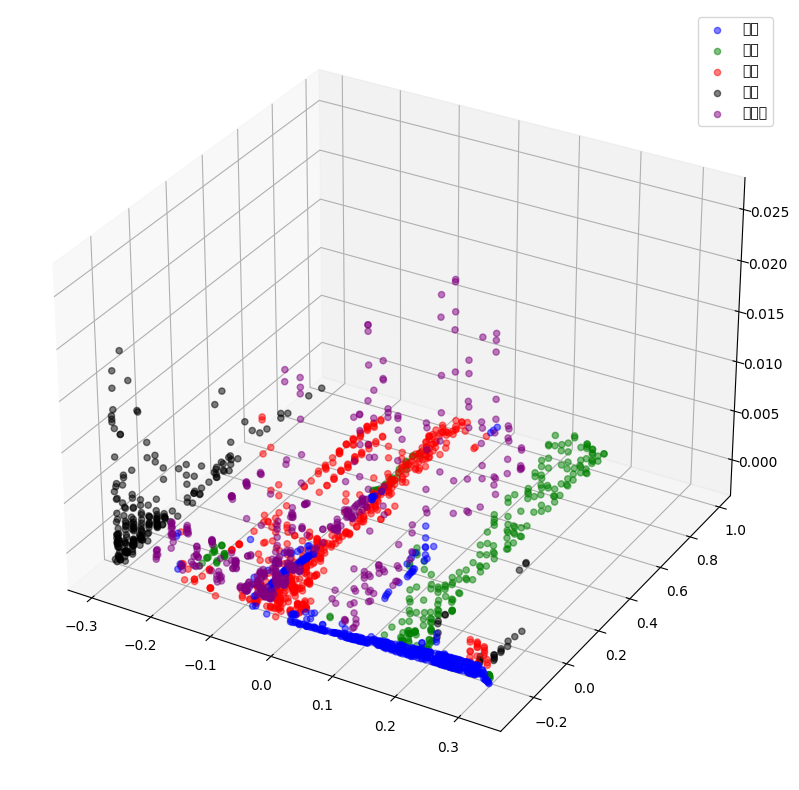

             x         y         z
0     0.158102 -0.300029 -0.001423
3     0.045395 -0.308386 -0.001571
4     0.267842 -0.308386 -0.000466
14    0.243521 -0.308386 -0.000542
17   -0.057820 -0.065481 -0.001346
...        ...       ...       ...
2015  0.102935 -0.308386 -0.001355
2017  0.258944 -0.291672 -0.001569
2026  0.099969 -0.308386 -0.001286
2030  0.283265 -0.300029 -0.001096
2034 -0.181559 -0.274951 -0.001453

[474 rows x 3 columns]
             x         y         z
6     0.178626  0.229294 -0.001580
12    0.177440  0.781053  0.004524
18   -0.182390 -0.073874 -0.001363
26    0.137340 -0.191276 -0.001287
32    0.178033 -0.149384  0.004250
...        ...       ...       ...
2028 -0.295926 -0.274951 -0.000111
2032  0.202591 -0.199647 -0.001372
2036 -0.061616  0.738415 -0.001227
2042  0.177914 -0.107451  0.003031
2045 -0.182390 -0.065481 -0.001489

[384 rows x 3 columns]
             x         y         z
1    -0.021754 -0.191276 -0.001118
5    -0.165306  0.483288 -0.001565
11   -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

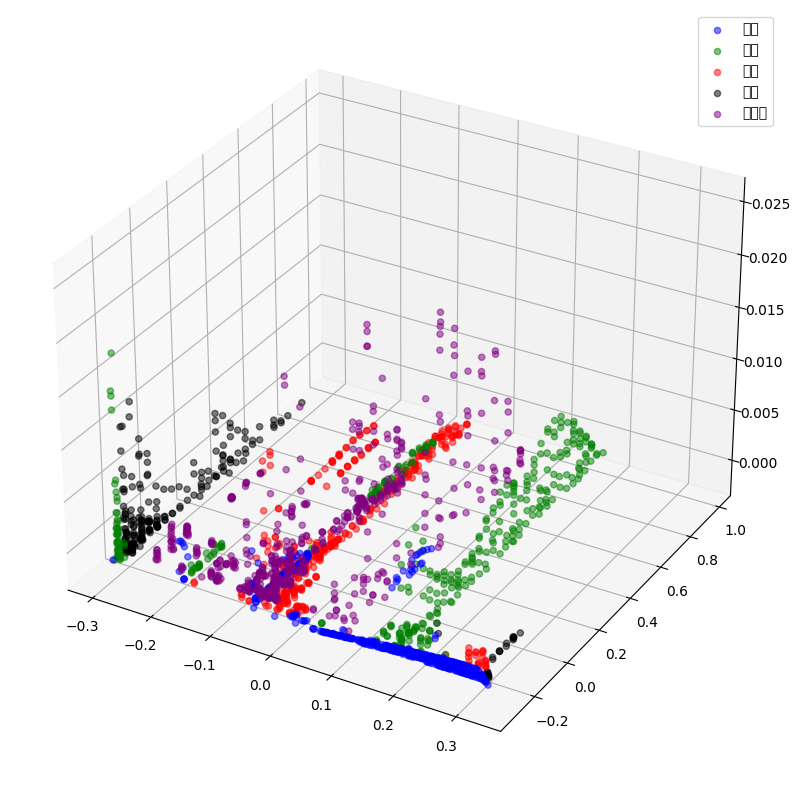

             x         y         z
5     0.282402 -0.291995 -0.001412
6     0.297234 -0.300353 -0.000951
12   -0.180929 -0.283637 -0.000276
19    0.212991 -0.308710 -0.000551
22    0.170871 -0.300353 -0.001270
...        ...       ...       ...
2034 -0.181522 -0.258550  0.001098
2039  0.293081 -0.291995 -0.001404
2040  0.318591 -0.300353 -0.001360
2044  0.257486 -0.291995 -0.001437
2045  0.151293 -0.300353 -0.001316

[471 rows x 3 columns]
             x         y         z
0     0.179057 -0.275272  0.001502
10    0.177990  0.102472 -0.000621
13    0.178464  0.186804  0.001179
18    0.178939 -0.149692  0.002678
34    0.178939  0.144623 -0.000350
...        ...       ...       ...
2017  0.179057  0.229027  0.000054
2023 -0.060499  0.738202 -0.001201
2026  0.179057  0.866196 -0.000365
2032  0.175498 -0.233448 -0.000517
2033  0.178939 -0.275272  0.002372

[289 rows x 3 columns]
             x         y         z
1    -0.043057  0.271278 -0.000041
4    -0.004258 -0.233448 -0.001406
7     0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

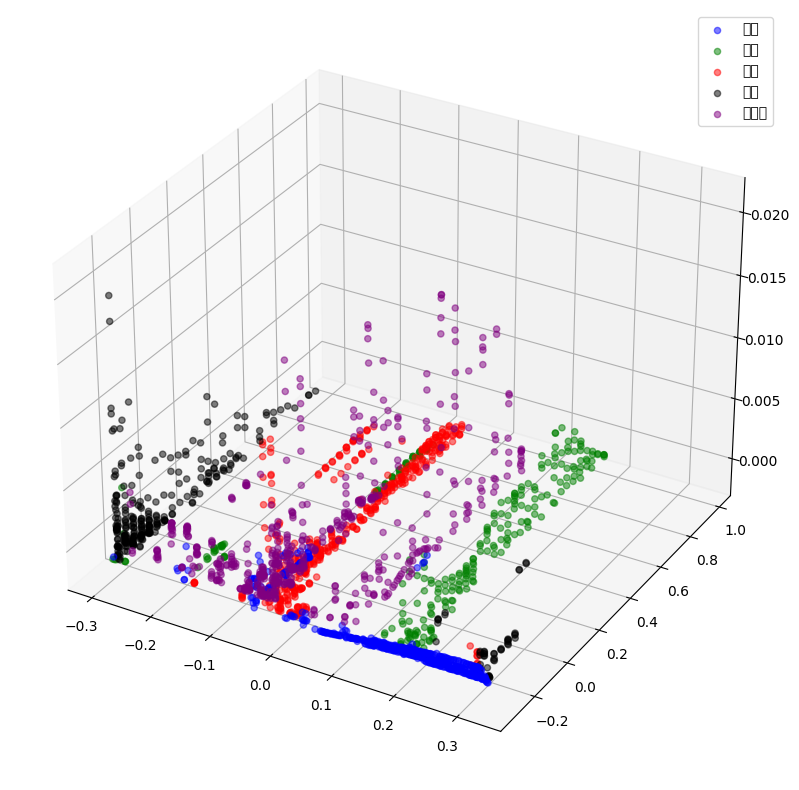

             x         y         z
4     0.284976 -0.307456 -0.000845
6     0.199664 -0.315861 -0.000272
12    0.230687 -0.307456 -0.000942
16    0.283783 -0.315861 -0.000094
18    0.315999 -0.299051 -0.001494
...        ...       ...       ...
2036 -0.061045 -0.307456  0.000598
2038  0.089892 -0.307456 -0.000652
2039 -0.058659 -0.037774 -0.001194
2044  0.064835 -0.315861 -0.001371
2045 -0.059852 -0.214918 -0.000867

[500 rows x 3 columns]
             x         y         z
8    -0.061880  0.608503 -0.000822
9    -0.059255  0.480349 -0.001463
13   -0.061642  0.565756 -0.001230
14    0.177829  0.983996 -0.001259
22    0.175681 -0.198080 -0.001180
...        ...       ...       ...
2010 -0.059255  0.420642 -0.001344
2012  0.178187 -0.071565  0.002219
2016  0.178783  0.865650 -0.000538
2037  0.178545  0.055279  0.000157
2042  0.203244 -0.273830 -0.001280

[300 rows x 3 columns]
             x         y         z
0    -0.045773 -0.240175  0.012377
1    -0.022148 -0.155949 -0.001399
2    -0

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 29976 (\N{CJK UNIFIED IDEOGRAPH-7518}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33609 (\N{CJK UNIFIED IDEOGRAPH-8349}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30070 (\N{CJK UNIFIED IDEOGRAPH-7576}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27512 (\N{CJK UNIFIED IDEOGRAPH-6B78}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 34180 (\N{CJK UNIFIED IDEOGRAPH-8584}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/

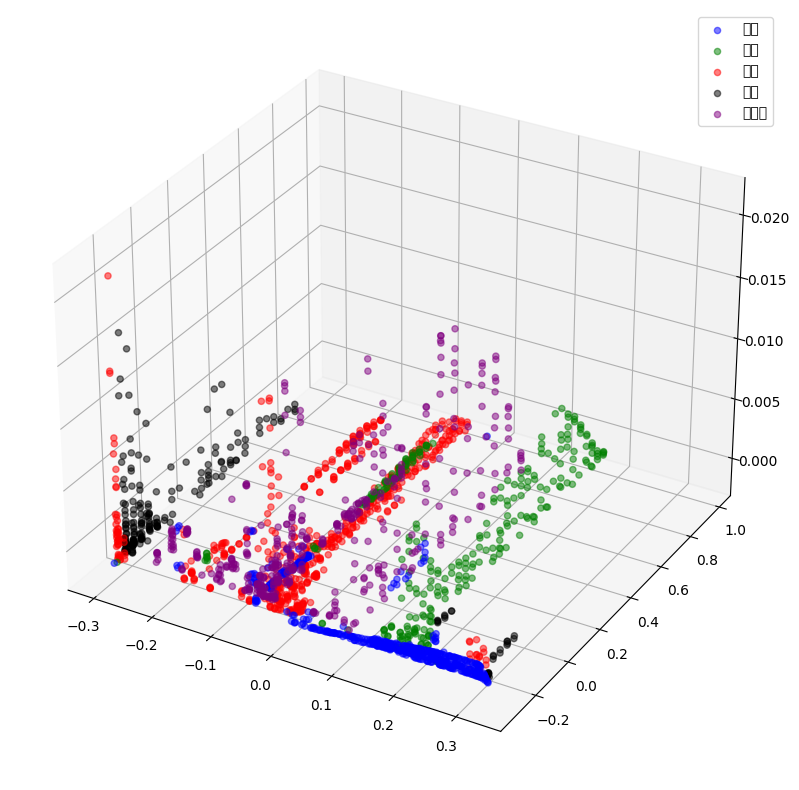

In [ ]:
directory = '/content/drive/MyDrive/5種藥材'

point_clouds_result = []
labels_result = []
point_clouds1 = []
point_clouds2 = []
point_clouds3 = []

COLORS = ['blue', 'green', 'red' ,'black' , 'purple']

def save_data(point_cloud, labels):


    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        c_df = c_df.drop('label',axis = 1)
        print(c_df)
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="blue":
            point_clouds_result.append(c_df)
            labels_result.append(0)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
          if COLORS[index]=="green":
            point_clouds_result.append(c_df)
            labels_result.append(1)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
          if COLORS[index]=="red":
            point_clouds_result.append(c_df)
            labels_result.append(2)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
          if COLORS[index]=="black":
            point_clouds_result.append(c_df)
            labels_result.append(3)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
          if COLORS[index]=="purple":
            point_clouds_result.append(c_df)
            labels_result.append(4)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    print(point_clouds1)
    ax.legend()
    plt.show()

def save_data1(point_cloud, labels):


    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="blue":
            point_clouds1.append(c_df)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    print(point_clouds1)
    ax.legend()
    plt.show()
def save_data2(point_cloud, labels):

    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="green":
            point_clouds2.append(c_df)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    print(point_clouds2)
    ax.legend()
    plt.show()
def save_data3(point_cloud, labels):

    df = pd.DataFrame(
        data={
            "x": point_cloud[:, 0],
            "y": point_cloud[:, 1],
            "z": point_cloud[:, 2],
            "label": labels,
        }
    )
    fig = plt.figure(figsize=(15, 10))
    ax = plt.axes(projection="3d")
    for index, label in enumerate(LABELS):
        c_df = df[df["label"] == label]
        try:
          # 改成前面參數設定的顏色
          if COLORS[index]=="red":
            point_clouds3.append(c_df)
            ax.scatter(
                c_df["x"], c_df["y"], c_df["z"], label=label, alpha=0.5, c=COLORS[index]
            )
        except IndexError:
            pass
    print(point_clouds3)
    ax.legend()
    plt.show()


def save_all_data(point_clouds, label_clouds):
    label_map = LABELS + ["none"]
    for idx in range(len(point_clouds)):
      point_cloud = point_clouds[idx]
      label_cloud = label_clouds[idx]
      # save_data1(point_cloud,[label_map[np.argmax(label)] for label in label_cloud])
      # save_data2(point_cloud,[label_map[np.argmax(label)] for label in label_cloud])
      # save_data3(point_cloud,[label_map[np.argmax(label)] for label in label_cloud])
      save_data(point_cloud,[label_map[np.argmax(label)] for label in label_cloud])

save_all_data(validation_batch[0], val_predictions)

# np.save(os.path.join(directory, 'point_clouds_predict1.npy'), point_clouds1)
# np.save(os.path.join(directory, 'point_clouds_predict2.npy'), point_clouds2)
# np.save(os.path.join(directory, 'point_clouds_predict3.npy'), point_clouds3)


## 儲存各個點雲圖

## 資料正規化

In [ ]:
directory = '/content/drive/MyDrive/5種藥材'
for index in tqdm(range(len(point_clouds_result))):
    current_point_cloud = point_clouds_result[index]
    num_points = len(current_point_cloud)
    # Randomly sampling respective indices.
    print(range(num_points))

100%|██████████| 150/150 [00:00<00:00, 7630.63it/s]

range(0, 474)
range(0, 284)
range(0, 481)
range(0, 193)
range(0, 616)
range(0, 359)
range(0, 295)
range(0, 608)
range(0, 276)
range(0, 510)
range(0, 559)
range(0, 311)
range(0, 375)
range(0, 232)
range(0, 571)
range(0, 455)
range(0, 500)
range(0, 443)
range(0, 121)
range(0, 529)
range(0, 356)
range(0, 488)
range(0, 503)
range(0, 124)
range(0, 577)
range(0, 486)
range(0, 308)
range(0, 532)
range(0, 251)
range(0, 471)
range(0, 446)
range(0, 295)
range(0, 412)
range(0, 255)
range(0, 640)
range(0, 464)
range(0, 321)
range(0, 483)
range(0, 219)
range(0, 561)
range(0, 583)
range(0, 309)
range(0, 343)
range(0, 284)
range(0, 529)
range(0, 463)
range(0, 403)
range(0, 473)
range(0, 206)
range(0, 503)
range(0, 471)
range(0, 325)
range(0, 442)
range(0, 247)
range(0, 563)
range(0, 491)
range(0, 283)
range(0, 461)
range(0, 209)
range(0, 604)
range(0, 388)
range(0, 431)
range(0, 424)
range(0, 147)
range(0, 658)
range(0, 572)
range(0, 349)
range(0, 484)
range(0, 230)
range(0, 413)
range(0, 597)
range(

In [ ]:
for index in tqdm(range(len(point_clouds_result))):
    current_point_cloud = point_clouds_result[index]
    num_points = len(current_point_cloud)
    # Randomly sampling respective indices.
    print(range(num_points))
    sampled_indices = random.sample(range(num_points), 120)

    # Sampling points corresponding to sampled indices.
    # sampled_indices = np.array(sampled_indices)
    sampled_point_cloud = np.array([current_point_cloud.iloc[i] for i in sampled_indices])
    # Normalizing sampled point cloud.
    norm_point_cloud = sampled_point_cloud - np.mean(sampled_point_cloud, axis=0)

    norm_point_cloud /= np.max(np.linalg.norm(norm_point_cloud, axis=1))
    # point_clouds[index] = np.resize(point_clouds[index],(2048,3))
    point_clouds_result[index] = norm_point_cloud


 26%|██▌       | 39/150 [00:00<00:00, 193.66it/s]

range(0, 474)
range(0, 284)
range(0, 481)
range(0, 193)
range(0, 616)
range(0, 359)
range(0, 295)
range(0, 608)
range(0, 276)
range(0, 510)
range(0, 559)
range(0, 311)
range(0, 375)
range(0, 232)
range(0, 571)
range(0, 455)
range(0, 500)
range(0, 443)
range(0, 121)
range(0, 529)
range(0, 356)
range(0, 488)
range(0, 503)
range(0, 124)
range(0, 577)
range(0, 486)
range(0, 308)
range(0, 532)
range(0, 251)
range(0, 471)
range(0, 446)
range(0, 295)
range(0, 412)
range(0, 255)
range(0, 640)
range(0, 464)
range(0, 321)
range(0, 483)
range(0, 219)
range(0, 561)


 54%|█████▍    | 81/150 [00:00<00:00, 202.67it/s]

range(0, 583)
range(0, 309)
range(0, 343)
range(0, 284)
range(0, 529)
range(0, 463)
range(0, 403)
range(0, 473)
range(0, 206)
range(0, 503)
range(0, 471)
range(0, 325)
range(0, 442)
range(0, 247)
range(0, 563)
range(0, 491)
range(0, 283)
range(0, 461)
range(0, 209)
range(0, 604)
range(0, 388)
range(0, 431)
range(0, 424)
range(0, 147)
range(0, 658)
range(0, 572)
range(0, 349)
range(0, 484)
range(0, 230)
range(0, 413)
range(0, 597)
range(0, 401)
range(0, 425)
range(0, 161)
range(0, 464)
range(0, 570)
range(0, 298)
range(0, 482)
range(0, 250)
range(0, 448)
range(0, 439)
range(0, 463)
range(0, 434)


 83%|████████▎ | 124/150 [00:00<00:00, 202.83it/s]

range(0, 134)
range(0, 578)
range(0, 399)
range(0, 355)
range(0, 428)
range(0, 264)
range(0, 602)
range(0, 535)
range(0, 375)
range(0, 356)
range(0, 214)
range(0, 568)
range(0, 422)
range(0, 386)
range(0, 494)
range(0, 179)
range(0, 567)
range(0, 519)
range(0, 316)
range(0, 398)
range(0, 299)
range(0, 516)
range(0, 479)
range(0, 347)
range(0, 502)
range(0, 243)
range(0, 477)
range(0, 477)
range(0, 295)
range(0, 485)
range(0, 270)
range(0, 521)
range(0, 392)
range(0, 355)
range(0, 450)
range(0, 189)
range(0, 662)
range(0, 561)
range(0, 394)
range(0, 431)
range(0, 213)
range(0, 449)


100%|██████████| 150/150 [00:00<00:00, 198.37it/s]

range(0, 488)
range(0, 300)
range(0, 546)
range(0, 289)
range(0, 425)
range(0, 502)
range(0, 285)
range(0, 545)
range(0, 245)
range(0, 471)
range(0, 474)
range(0, 384)
range(0, 373)
range(0, 229)
range(0, 588)
range(0, 471)
range(0, 289)
range(0, 418)
range(0, 313)
range(0, 557)
range(0, 500)
range(0, 300)
range(0, 592)
range(0, 217)
range(0, 439)


# 儲存classification用(放到classification自己的資料那部分)

In [ ]:
# np.save(os.path.join(directory, 'point_clouds_predict1.npy'), point_clouds1)
# np.save(os.path.join(directory, 'point_clouds_predict2.npy'), point_clouds2)
# np.save(os.path.join(directory, 'point_clouds_predict3.npy'), point_clouds3)
np.save('/content/drive/MyDrive/5種藥材/point_clouds_thres_0.1_for_classification_5kind_120points.npy',point_clouds_result)
np.save('/content/drive/MyDrive/5種藥材/point_clouds_labels_thres_0.1_for_classification_5kind_120points.npy', labels_result)
